# **Detecting Parkinson’s disease from short speech recordings**

## **Abstract**

This study evaluates the performance of various deep neural architectures for early detection of Parkinson's Disease (PD) through voice analysis implemented via the SpeechBrain framework. Parkinson's disease affects millions globally and often manifests speech abnormalities before other symptoms appear, making voice analysis a promising tool for early detection. Timely diagnosis is crucial for effective management and treatment.

Our comparative analysis explores multiple approaches on Italian_Parkinsons_Voice_and_Speech dataset, including feature extraction methods (MFCCs and FBanks), data augmentation techniques with noise addition, and transfer learning strategies. Across models including Xvector and ECAPA-TDNN, we demonstrate that fine-tuning the pre-trained model like Wav2Vec2 and WavLM model through transfer learning yields exceptional results, achieving near-perfect classification accuracy on our dataset. 

These findings represent a significant advancement in non-invasive screening techniques for Parkinson's Disease, potentially transforming diagnostic approaches and patient outcomes through accessible, reliable, and early detection methods.   



## **Introduction**

Parkinson's disease (PD) is a chronic and progressive neurodegenerative disorder that primarily affects people over 50 years of age. It manifests through both motor symptoms (movement disorders, tremors, gait issues, stiffness, and postural instability) and non-motor symptoms (cognitive dysfunction, mood disorders, depression, and anxiety)[1,2,3]. Early diagnosis of PD is crucial for effective management and treatment, yet remains challenging as no definitive medical test exists for early-stage detection. Traditional diagnosis relies on clinical assessments, neurological examinations, and imaging techniques like MRI and PET/CT scans, which often depend heavily on specialists' expertise and may not detect subtle early indicators.

Speech abnormalities represent one of the earliest manifestations of PD, appearing before other symptoms become clinically evident in many patients. This makes voice analysis a particularly promising avenue for early, non-invasive detection. Recent advancements in machine learning and deep learning have significantly improved early PD detection approaches, especially through the analysis of such premotor symptoms [4].

Several studies have explored audio-based approaches for PD detection with varying degrees of success. A novel subject-based Bayesian approach demonstrated acceptable discrimination between healthy individuals and those with PD, despite being limited by a small sample of 80 subjects [5]. Other research has investigated both sustained phonation and text-dependent speech recordings using various signal processing approaches [7]. These studies compared professional acoustic cardioid microphones with smartphone recordings and evaluated different audio feature sets, finding that fusion-based approaches combining multiple feature sets and modalities yielded improved performance.

Most recently, Klempíř and Krupička (2024) [8] demonstrated that self-supervised speech representations using wav2vec 1.0 embeddings outperform traditional mel-frequency cepstral coefficients (MFCCs) in cross-database classification tasks across multiple languages. Their work identified consistent speech patterns linked to PD that enhanced the generalizability of their approach. Also, another 2020 study [9] analysed x-Vectors in combination with PCA and PLDA for the automatic detection of PD, and gained around 90% accuracy, suggesting that the DNN speaker embeddings are capturing phonatory and/or articulatory information that is relevant for PD detection and that characterizes parkinsonian speech.

Building on these foundations, our study develops and evaluates multiple speech processing models of increasing complexity implemented through the SpeechBrain framework. Our approach distinguishes itself by systematically comparing various deep neural architectures—including Xvector and ECAPA-TDNN—combined with different speech feature extraction techniques such as MFCCs and FBanks within a unified experimental framework, whereas previous studies typically focused on a single model or technique. We also harness the power of transfer learning from large-scale self-supervised speech models (WavLM, Wav2Vec2) that were pre-trained on thousands of hours of speech data, allowing our system to leverage acoustic patterns learned from diverse speech contexts rather than starting from scratch. This transfer learning strategy significantly improves performance on limited PD-specific datasets. Additionally, our approach enhances overall performance through strategic data augmentation techniques (primarily noise and reverberation addition) and extensive hyperparameter optimization to maximize generalization capabilities.

This study uses SpeechBrain toolkit since it provides several technical advantages critical to our research. Its modular design allowed us to implement, fine-tune, and compare multiple architectures within a consistent experimental framework, ensuring fair comparisons across models. SpeechBrain's integrated data augmentation pipeline enabled robust implementation of speech augmentation techniques (noise addition, reverberation, speed perturbation) that improved generalization. Additionally, its optimized implementation of self-supervised speech models facilitated efficient fine-tuning of large pre-trained models with minimal code changes, making advanced techniques accessible for medical speech analysis applications.

We utilize the publicly available Italian_Parkinsons_Voice_and_Speech dataset from birgermoell, comprising 800 audio files from 65 Italian speakers (37 healthy individuals and 28 with Parkinson's disease). Our comparative analysis demonstrates that fine-tuning the pre-trained WavLM model through transfer learning yields exceptional results, achieving near-perfect classification accuracy on our dataset. These findings represent a significant advancement in developing accessible, reliable, and early detection methods for Parkinson's disease through voice analysis.


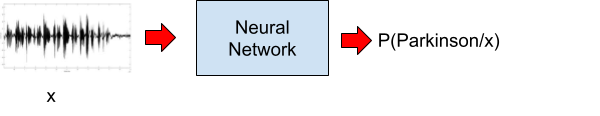

## **Methodology**

To develop an effective system for Parkinson’s disease detection from speech, we followed a multi-phase approach grounded in existing literature and advanced deep learning frameworks. We began with an extensive literature review to understand the current state-of-the-art in speech-based detection of Parkinson’s disease and related neurological conditions such as Alzheimer’s and concussions. This helped us identify effective architectures, relevant features, and commonly used datasets.

Our modeling approach progressed through several key stages:


> **Baseline Architecture Implementation:** We initially implemented off-the-shelf architectures from the SpeechBrain toolkit, specifically Xvectors and ECAPA-TDNN models. These were evaluated using both MFCC and filterbank features to establish a performance baseline.

> **Self-Supervised Learning Integration:** A significant advancement in our methodology was the adaptation and fine-tuning of pre-trained self-supervised speech models (wav2vec2 and WavLM) for Parkinson's detection. This approach leveraged large-scale pre-training on general speech data, which we then specialized for our specific task through careful fine-tuning procedures.

> **Systematic Hyperparameter Optimization:** We implemented an automated hyperparameter tuning framework using Oríon, which allowed us to efficiently explore the parameter space across multiple model architectures. This systematic approach helped identify optimal configurations that might have been missed through manual tuning.

To enhance robustness, we explored several complementary strategies, including data augmentation, transfer learning, and model complexity variation. Multiple iterations and evaluations guided our selection of the best-performing models.




In [ ]:
!git clone https://huggingface.co/datasets/birgermoell/Italian_Parkinsons_Voice_and_Speech/

Cloning into 'Italian_Parkinsons_Voice_and_Speech'...
remote: Enumerating objects: 920, done.
remote: Counting objects: 100% (917/917), done.
remote: Compressing objects: 100% (917/917), done.
remote: Total 920 (delta 2), reused 0 (delta 0), pack-reused 3 (from 1)
Receiving objects: 100% (920/920), 199.61 KiB | 16.63 MiB/s, done.
Resolving deltas: 100% (2/2), done.
Filtering content: 100% (832/832), 1.34 GiB | 13.12 MiB/s, done.


In [ ]:
%%capture
!pip install speechbrain

In [ ]:
%%capture
!pip install flake8 pycodestyle_magic

In [ ]:
%load_ext pycodestyle_magic
%flake8_on

In [ ]:
import os
import sys
import torch
import torchaudio
import matplotlib.pyplot as plt
from IPython.display import Audio
import speechbrain as sb
from speechbrain.utils import hpopt as hp
import numpy as np
import json
import random
from hyperpyyaml import load_hyperpyyaml

DEBUG:speechbrain.utils.checkpoints:Registered checkpoint save hook for _speechbrain_save
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint load hook for _speechbrain_load
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint save hook for save
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint load hook for load
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint save hook for _save
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint load hook for _recover


In [ ]:
%%capture
!pip install orion[profet]

## **Experimental Setup**

 To ensure strict separation, data divided by speakers into disjoint groups i.e., all recordings from a given speaker were used exclusively in either the training, validation or testing set. This step was critical to avoid data leakage and ensure realistic generalization performance. The data is divided into train, validation and test set having 75%, 10% and 15% of total size with following count of audio files of each category:

| Type       | Healthy | Diseased |
| ---------- | ------- | -------- |
| Train      |   289  | 327 |
| Test       |    83  | 80 |
| Validation |   22  |  30 |



#### Loss and Error

All the model use negative log-likelihood (NLL) loss as the training objective, while measuring classification error rate as the evaluation metric. The NLL loss is appropriate for this binary classification task of detecting Parkinson's disease, working with the probabilities output by the model's classifier component.

In [ ]:
DATASET = 'Italian_Parkinsons_Voice_and_Speech/italian_parkinson'
RANDOM_SEED = 2023
torch.manual_seed(RANDOM_SEED)


def count_files(root_directory):
    """
    Iterates through a directory and subfolders to count and collect files.

    Args:
        root_directory (str): The root directory to start searching from

    Returns:
        int: Total number of .wav files found
    """
    wav_count = 0
    diseased_count = 0
    healthy_count = 0
    diseased_audio = set()
    healthy_audio = set()

    for dirpath, dirnames, filenames in os.walk(root_directory):
        for filename in filenames:
            if filename.lower().endswith('.wav'):
                wav_count += 1
                if "Parkinson's" in dirpath:
                    diseased_count += 1
                    diseased_audio.add(dirpath)
                elif "Healthy" in dirpath:
                    healthy_count += 1
                    healthy_audio.add(dirpath)

        print(f"{sum(1 for f in filenames if f.lower().endswith('.wav'))}"
              f" .wav files found in {dirpath}")

    return (wav_count, diseased_count, healthy_count, diseased_audio,
            healthy_audio)


total, diseased, healthy, diseased_list, healthy_list = count_files(DATASET)
print("Total wav files:", total)
print("Total diseased:", diseased)
print("Total healthy:", healthy)

0 .wav files found in Italian_Parkinsons_Voice_and_Speech/italian_parkinson
0 .wav files found in Italian_Parkinsons_Voice_and_Speech/italian_parkinson/28 People with Parkinson's disease
0 .wav files found in Italian_Parkinsons_Voice_and_Speech/italian_parkinson/28 People with Parkinson's disease/11-16
16 .wav files found in Italian_Parkinsons_Voice_and_Speech/italian_parkinson/28 People with Parkinson's disease/11-16/Nicola S
16 .wav files found in Italian_Parkinsons_Voice_and_Speech/italian_parkinson/28 People with Parkinson's disease/11-16/Vito S
16 .wav files found in Italian_Parkinsons_Voice_and_Speech/italian_parkinson/28 People with Parkinson's disease/11-16/Anna B
16 .wav files found in Italian_Parkinsons_Voice_and_Speech/italian_parkinson/28 People with Parkinson's disease/11-16/Roberto R
16 .wav files found in Italian_Parkinsons_Voice_and_Speech/italian_parkinson/28 People with Parkinson's disease/11-16/Michele C
16 .wav files found in Italian_Parkinsons_Voice_and_Speech/ital

Shape of waveform: torch.Size([1, 612728])
Sample rate: 16000



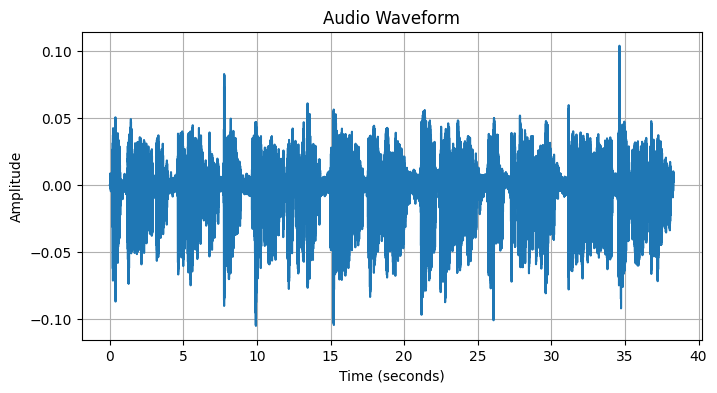





Shape of waveform: torch.Size([1, 3244628])
Sample rate: 44100



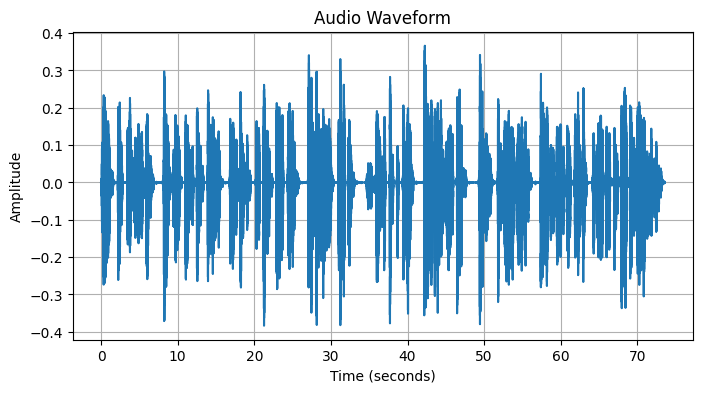

In [ ]:
def load_and_analyze_audio(file_path):
    """
    Load an audio file, display its properties,
    plot the waveform, and create an audio player

    Args:
        file_path (str): Path to the audio file

    Returns:
        tuple: (waveform tensor, sample rate)
    """

    waveform, sample_rate = torchaudio.load(file_path)

    print(f"Shape of waveform: {waveform.shape}")
    print(f"Sample rate: {sample_rate}\n")

    if waveform.shape[0] > 1:
        waveform = torch.mean(waveform, dim=0, keepdim=True)

    plt.figure(figsize=(8, 4))
    time_axis = torch.arange(0, waveform.shape[1]) / sample_rate
    plt.plot(time_axis, waveform[0])
    plt.title('Audio Waveform')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

    waveform_np = waveform.numpy()[0]  # Convert to numpy and get first channel
    return Audio(waveform_np, rate=sample_rate)


file_path = "/15 Young Healthy Control/Alberto R/B1LBULCAAS94M100120171015.wav"

audio_player = load_and_analyze_audio(DATASET + file_path)
print()
display(audio_player)

print()
print()
print()
print()

file_path = ("/28 People with Parkinson's disease/1-5/Domenico C/"
             "B1cdaopmoe67M2605161902.wav")
audio_player = load_and_analyze_audio(DATASET + file_path)
print()
display(audio_player)

In [ ]:
random.seed(RANDOM_SEED)


def split_data_non_overlapping(input_list, train_fraction, val_fraction,
                               test_fraction):
    """
    Splits a list into non-overlapping train, validation,
    and test sets based on specified fractions.

    Args:
        input_list: The input list of items.
        train_fraction: Fraction of data to use for training.
        val_fraction: Fraction of data to use for validation.
        test_fraction: Fraction of data to use for testing.

    Returns:
        A tuple of (train_set, val_set, test_set) with non-overlapping elements
    """
    # Verify fractions add up to 1
    total_fraction = train_fraction + val_fraction + test_fraction
    # Use small epsilon for float comparison
    if not abs(total_fraction - 1.0) < 1e-10:
        raise ValueError(f"Fractions must sum to 1, got {total_fraction}")

    # Create a shuffled copy of the input list
    shuffled_list = input_list.copy()
    random.shuffle(shuffled_list)

    # Calculate sizes
    total_size = len(input_list)
    train_size = int(total_size * train_fraction)
    val_size = int(total_size * val_fraction)
    # test_size will be the remainder to avoid rounding errors

    # Split the data
    train_set = shuffled_list[:train_size]
    val_set = shuffled_list[train_size:train_size + val_size]
    test_set = shuffled_list[train_size + val_size:]

    return train_set, val_set, test_set


# Constants
TRAIN_SIZE = 0.75
VALIDATION_SIZE = 0.10
TEST_SIZE = 0.15

train_diseased, val_diseased, test_diseased = split_data_non_overlapping(
    list(diseased_list),
    TRAIN_SIZE,
    VALIDATION_SIZE,
    TEST_SIZE
)

print(f"Train set: {len(train_diseased)} diseased audio files")
print(f"Validation set: {len(val_diseased)} diseased audio files")
print(f"Test set: {len(test_diseased)} diseased audio files")

train_healthy, val_healthy, test_healthy = split_data_non_overlapping(
    list(healthy_list),
    TRAIN_SIZE,
    VALIDATION_SIZE,
    TEST_SIZE
)

print(f"\nTrain set: {len(train_healthy)} healthy speaker files")
print(f"Validation set: {len(val_healthy)} healthy speaker files")
print(f"Test set: {len(test_healthy)} healthy speaker files")

# Verify there's no overlap between sets
assert len(set(train_diseased).intersection(set(val_diseased))) == 0
assert len(set(train_diseased).intersection(set(test_diseased))) == 0
assert len(set(val_diseased).intersection(set(test_diseased))) == 0
assert len(set(train_healthy).intersection(set(val_healthy))) == 0
assert len(set(train_healthy).intersection(set(test_healthy))) == 0
assert len(set(val_healthy).intersection(set(test_healthy))) == 0

Train set: 21 diseased audio files
Validation set: 2 diseased audio files
Test set: 5 diseased audio files

Train set: 27 healthy speaker files
Validation set: 3 healthy speaker files
Test set: 7 healthy speaker files


In [ ]:
len(healthy_list), len(diseased_list)

(37, 28)

In [ ]:
def create_json(json_file, audiolist, typ):
    json_dict = {}
    healthy = 0
    diseased = 0
    for audios in audiolist:
        for audiodir in audios:
            for audiofile in os.listdir(audiodir):
                audiofile = os.path.join(audiodir, audiofile)
                if not audiofile.endswith(".wav"):
                    continue
                audioinfo = torchaudio.info(audiofile)

                # Compute the duration in seconds.
                duration = audioinfo.num_frames / audioinfo.sample_rate

                # Get digit Label by manipulating the audio path
                digit = audiofile.split('/')[-1].split("_")[0]

                # Get a unique utterance id
                uttid = audiofile.split('/')[-1]

                condition = "healthy" if "Healthy" in audiofile else "diseased"
                if condition == "healthy":
                    healthy += 1
                else:
                    diseased += 1
                # Create entry for this utterance
                json_dict[uttid] = {
                        "path": audiofile,
                        "length": duration,
                        "condition": condition
                }

    print(f"Total {typ} files: {len(json_dict)}")
    print(f"Total {typ} healthy: {healthy}")
    print(f"Total {typ} diseased: {diseased}")
    print()
    # Writing the dictionary to the json file
    with open(json_file, mode="w") as json_f:
        json.dump(json_dict, json_f, indent=2)


create_json('train.json', [train_diseased, train_healthy], "Train")
create_json('valid.json', [val_diseased, val_healthy], "Validation")
create_json('test.json', [test_diseased, test_healthy], "Test")

Total Train files: 616
Total Train healthy: 289
Total Train diseased: 327

Total Validation files: 52
Total Validation healthy: 22
Total Validation diseased: 30

Total Test files: 163
Total Test healthy: 83
Total Test diseased: 80



In [ ]:
%flake8_off

# **Xvector with FBANKS**

#### Hyperparamter are tuned using Orion Framework which is a asynchronous framework for black-box function optimization.
For more details on how to configure it in speech brain [refer here](https://speechbrain.readthedocs.io/en/latest/tutorials/advanced/hyperparameter-optimization.html#hyperparameter-optimization)

### X-vector Model for Parkinson's Disease Detection from Speech

> Model Architecture:
Our approach to Parkinson's disease detection from speech signals utilizes an X-vector architecture implemented through the SpeechBrain toolkit. The X-vector model was originally developed for speaker recognition tasks but has been adapted here for binary classification of speech patterns indicative of Parkinson's disease.

We explored X-vector architecture and Time Delay Neural Networks (TDNNs) along with different features extracted from audio files using signal processing.

## X-vector Architecture

X-vector is a neural network-based speaker embedding framework that has become a standard approach in speaker recognition tasks. Key characteristics include:

1. **Architecture Design**: X-vector consists of frame-level feature extraction layers, a statistical pooling layer, and utterance-level layers. This design allows the model to convert variable-length speech utterances into fixed-dimensional embeddings.

2. **Speaker Representation**: Unlike traditional i-vector approaches that rely on statistical modeling, X-vectors use a purely neural network-based approach to learn discriminative speaker representations directly from spectral features.

3. **Adaptability**: Though originally designed for speaker verification and identification, the architecture has proven effective for various speech classification tasks including language identification, emotion recognition, and pathological speech detection.

4. **Efficiency**: X-vectors typically require less computation during inference compared to more complex architectures like end-to-end deep neural networks (MLP).

## Time Delay Neural Networks (TDNNs)

TDNNs form the core of the X-vector architecture's frame-level processing and have several distinctive properties:

1. **Temporal Modeling**: TDNNs are designed to model temporal relationships in sequential data by applying the same set of filters across different time steps, similar to how CNNs operate spatially.

2. **Context Awareness**: Each TDNN layer operates on a specific temporal context, with earlier layers typically capturing short-term dependencies and later layers handling longer-term patterns by utilizing dilated convolutions.

3. **Dilated Convolutions**: TDNNs often employ dilated convolutions, where the filter weights are applied to inputs with specific gaps or dilations between them. This allows the network to efficiently model long-range dependencies without dramatically increasing the number of parameters.

4. **Parameter Efficiency**: By sharing weights across time steps and using dilated convolutions, TDNNs can model long temporal contexts with fewer parameters than recurrent alternatives like LSTMs.

5. **Training Advantage**: Unlike recurrent architectures, TDNNs can be fully parallelized during training, resulting in faster convergence on modern GPU hardware.

These components work together in the X-vector model to effectively capture the time-varying acoustic characteristics in speech that may indicate neurological conditions like Parkinson's disease, including subtle changes in articulation, prosody, and voice quality that might not be apparent to the human ear.

The model pipeline consists of several key components:

1. Feature Extraction: We employ Filterbank (FBANK) features with 60 mel frequency bands, capturing the spectral characteristics of speech that may be subtly altered in Parkinson's patients.

2. Embedding Model: The X-vector architecture consists of a series of Time Delay Neural Network (TDNN) layers followed by statistical pooling and fully connected layers. This structure effectively captures both frame-level and utterance-level information from variable-length speech inputs.

3. Classification Layer: A feed-forward neural network with LeakyReLU activation functions processes the embeddings to make the final binary classification (Diseased vs. Healthy).

4. Hyperparameters
The model configuration was optimized through systematic hyperparameter (mainly batch_size, embedding dimensions, mel filters,and sampling rate) tuning using the Orion framework.

These are the finally tunned paramter list:

| Name       | Value  |
| ---------- | ------- |
| Batch Size      |   16  |
| Embedding dimension       |    1024  |
| Number of mel filters |   60  |  
| Sampling rate |   12000  |  
| Number of epochs |   20  |  
| Learning rate |   0.001 -> 0.00001 (linear annealing)  |  

> TDNN architecture:

* 5 TDNN blocks
* Channel dimensions: [64, 64, 64, 128, 512]
* Kernel sizes: [5, 3, 2, 1, 1]
* Dilation factors: [1, 2, 3, 2, 1]
* Classifier: Single linear block with 1024 hidden neurons and LeakyReLU activation

In [ ]:
!mkdir -p xvector/fbanks/orion

In [ ]:
%%file xvector/fbanks/orion/hparams_xvector_fbanks.yaml

# #################################
# Basic training parameters for detecting parkinson's disease with Xvector
#
# #################################

# Seed needs to be set at top of yaml, before objects with parameters are made
seed: 2023
__set_seed: !!python/object/apply:torch.manual_seed [!ref <seed>]

#Used by orion and hpot
hpopt_mode: null
hpopt: null
#checkpointer switched off to avoid ssue with orion
ckpt_enable: False

output_folder: !ref ./results/Parkinson/Xvector/FBANKs/<seed>
save_folder: !ref <output_folder>/save
train_log: !ref <output_folder>/train_log.txt

# Path where data manifest files are stored
train_annotation: train.json
valid_annotation: valid.json
test_annotation: test.json

# The train logger writes training statistics to a file, as well as stdout.
train_logger: !new:speechbrain.utils.train_logger.FileTrainLogger
    save_file: !ref <train_log>

error_stats: !name:speechbrain.utils.metric_stats.MetricStats
    metric: !name:speechbrain.nnet.losses.classification_error
        reduction: batch

# Feature parameters
n_mels: 40

# Training Parameters
sample_rate: 16000
number_of_epochs: 20
batch_size: 16
lr_start: 0.001
lr_final: 0.00001
n_classes: 2 # 2 types of speaker diseased and healthy
emb_dim: 512 # dimensionality of the embeddings
dataloader_options:
    batch_size: !ref <batch_size>
    drop_last: True

# Feature extraction
compute_features: !new:speechbrain.lobes.features.Fbank
    n_mels: !ref <n_mels>

# Embedding model: from variable size langauge gets a fixed size embedding vector
embedding_model: !new:speechbrain.lobes.models.Xvector.Xvector
    in_channels: !ref <n_mels>
    activation: !name:torch.nn.LeakyReLU
    tdnn_blocks: 5
    tdnn_channels: [ 64, 64, 64, 128, 512]
    tdnn_kernel_sizes: [5, 3, 2, 1, 1]
    tdnn_dilations: [1, 2, 3, 2, 1]
    lin_neurons: !ref <emb_dim>

# Clasifier applied on top of the embeddings
classifier: !new:speechbrain.lobes.models.Xvector.Classifier
    input_shape: [null, null, !ref <emb_dim>]
    activation: !name:torch.nn.LeakyReLU
    lin_blocks: 1
    lin_neurons: !ref <emb_dim>
    out_neurons: !ref <n_classes>

# Mean and std normalization of the input features
mean_var_norm: !new:speechbrain.processing.features.InputNormalization
    norm_type: global

# The first object passed to the Brain class is this "Epoch Counter"
# which is saved by the Checkpointer so that training can be resumed
# if it gets interrupted at any point.
epoch_counter: !new:speechbrain.utils.epoch_loop.EpochCounter
    limit: !ref <number_of_epochs>

# Objects in "modules" dict will have their parameters moved to the correct
# device, as well as having train()/eval() called on them by the Brain class.
modules:
    compute_features: !ref <compute_features>
    mean_var_norm: !ref <mean_var_norm>
    embedding_model: !ref <embedding_model>
    classifier: !ref <classifier>

# This optimizer will be constructed by the Brain class after all parameters
# are moved to the correct device. Then it will be added to the checkpointer.
opt_class: !name:torch.optim.Adam
    lr: !ref <lr_start>

# This function manages learning rate annealing over the epochs.
# We here use the simple lr annealing method that linearly decreases
# the lr from the initial value to the final one.
lr_annealing: !new:speechbrain.nnet.schedulers.LinearScheduler
    initial_value: !ref <lr_start>
    final_value: !ref <lr_final>
    epoch_count: !ref <number_of_epochs>

# lr_annealing: !new:speechbrain.nnet.schedulers.NewBobScheduler
#     initial_value: !ref <lr_start>
#     improvement_threshold: 0.0025
#     annealing_factor: 0.9
#     patient: 0

# This object is used for saving the state of training both so that it
# can be resumed if it gets interrupted, and also so that the best checkpoint
# can be later loaded for evaluation or inference.
checkpointer: !new:speechbrain.utils.checkpoints.Checkpointer
    checkpoints_dir: !ref <save_folder>
    recoverables:
        embedding_model: !ref <embedding_model>
        classifier: !ref <classifier>
        normalizer: !ref <mean_var_norm>
        counter: !ref <epoch_counter>

Overwriting xvector/fbanks/orion/hparams_xvector_fbanks.yaml


In [ ]:
%%file xvector/fbanks/orion/train_fbanks.py

#!/usr/bin/env python3
import os
import sys
import torch
import torchaudio
import speechbrain as sb
from hyperpyyaml import load_hyperpyyaml
from speechbrain.utils import hpopt as hp


# Brain class for speech enhancement training
class SpeakerBrain(sb.Brain):
    """Class that manages the training loop. See speechbrain.core.Brain."""

    def compute_forward(self, batch, stage):
        """Runs all the computations that transforms the input into the
        output probabilities over the N classes.

        Arguments
        ---------
        batch : PaddedBatch
            Contains all the relevant tensors for computation.
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        Returns
        -------
        predictions : Tensor
            Contains the posterior probabilities over the N classes.
        """
        batch = batch.to(self.device)
        wavs, wav_lens = batch.sig
        feats = self.modules.compute_features(wavs)
        # feats = self.modules.mean_var_norm(feats, wav_lens)
        embeddings = self.modules.embedding_model(feats, wav_lens)
        predictions = self.modules.classifier(embeddings)
        return predictions

    def compute_objectives(self, predictions, batch, stage):
        """Computes the loss given the predicted and targeted outputs.

        Arguments
        ---------
        predictions : tensor
            The output tensor from `compute_forward`.
        batch : PaddedBatch
            This batch object contains all the relevant tensors for computation.
        stage : sb.Stage
            Stage.TRAIN, Stage.VALID, or Stage.TEST.
        Returns
        -------
        loss : torch.Tensor
            A one-element tensor used for backpropagating the gradient.
        """
        _, wav_lens = batch.sig
        conditions, _ = batch.condition_encoded
        loss = sb.nnet.losses.nll_loss(predictions, conditions, wav_lens)
        self.loss_metric.append(
            batch.id, predictions, conditions, wav_lens, reduction="batch"
        )

        if stage != sb.Stage.TRAIN:
            self.error_metrics.append(batch.id, predictions, conditions, wav_lens)

        return loss

    def on_stage_start(self, stage, epoch=None):
        """Gets called at the beginning of each epoch.
        Arguments
        ---------
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        epoch : int
            The currently-starting epoch. This is passed
            `None` during the test stage.
        """

        # Set up statistics trackers for this stage
        self.loss_metric = sb.utils.metric_stats.MetricStats(
            metric=sb.nnet.losses.nll_loss
        )

        # Set up evaluation-only statistics trackers
        if stage != sb.Stage.TRAIN:
            self.error_metrics = self.hparams.error_stats()

    def on_stage_end(self, stage, stage_loss, epoch=None):
        """Gets called at the end of an epoch.
        Arguments
        ---------
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, sb.Stage.TEST
        stage_loss : float
            The average loss for all of the data processed in this stage.
        epoch : int
            The currently-starting epoch. This is passed
            `None` during the test stage.
        """

        # Store the train loss until the validation stage.
        if stage == sb.Stage.TRAIN:
            self.train_loss = stage_loss

        # Summarize the statistics from the stage for record-keeping.
        else:
            stats = {
                "loss": stage_loss,
                "error": self.error_metrics.summarize("average"),
            }

        # At the end of validation...
        if stage == sb.Stage.VALID:

            old_lr, new_lr = self.hparams.lr_annealing(epoch)
            sb.nnet.schedulers.update_learning_rate(self.optimizer, new_lr)

            # The train_logger writes a summary to stdout and to the logfile.
            self.hparams.train_logger.log_stats(
                {"Epoch": epoch, "lr": old_lr},
                train_stats={"loss": self.train_loss},
                valid_stats=stats,
            )

            hp.report_result(stats)


            # Save the current checkpoint and delete previous checkpoints,
            # ckpt_enable is set ot false to avoid issue with orion
            if self.hparams.ckpt_enable:
                self.checkpointer.save_and_keep_only(meta=stats, min_keys=["error"])

        # We also write statistics about test data to stdout and to the logfile.
        if stage == sb.Stage.TEST:
            self.hparams.train_logger.log_stats(
                {"Epoch loaded": self.hparams.epoch_counter.current},
                test_stats=stats,
            )


def dataio_prep(hparams):
    """This function prepares the datasets to be used in the brain class.
    It also defines the data processing pipeline through user-defined functions.
    Arguments
    ---------
    hparams : dict
        This dictionary is loaded from the `train.yaml` file, and it includes
        all the hyperparameters needed for dataset construction and loading.
    Returns
    -------
    datasets : dict
        Contains two keys, "train" and "valid" that correspond
        to the appropriate DynamicItemDataset object.
    """

    # Initialization of the label encoder.
    label_encoder = sb.dataio.encoder.CategoricalEncoder()

    # Define audio pipeline
    @sb.utils.data_pipeline.takes("path")
    @sb.utils.data_pipeline.provides("sig")
    def audio_pipeline(wav):
        """Load the signal, and pass it and its length to the corruption class.
        This is done on the CPU in the `collate_fn`."""
        sig, fs = torchaudio.load(wav)

        sig = torchaudio.functional.resample(sig, fs, hparams["sample_rate"])
        sig = sig.squeeze()

        return sig

    # Define label pipeline:
    @sb.utils.data_pipeline.takes("condition")
    @sb.utils.data_pipeline.provides("condition", "condition_encoded")
    def label_pipeline(condition):
        """Defines the pipeline to process the condition labels.
        Note that we have to assign a different integer to each class
        through the label encoder.
        """
        yield condition
        condition_encoded = label_encoder.encode_label_torch(condition)
        yield condition_encoded

    # Define datasets
    datasets = {}
    data_info = {
        "train": hparams["train_annotation"],
        "valid": hparams["valid_annotation"],
        "test": hparams["test_annotation"],
    }
    hparams["dataloader_options"]["shuffle"] = True
    for dataset in data_info:
        datasets[dataset] = sb.dataio.dataset.DynamicItemDataset.from_json(
            json_path=data_info[dataset],
            dynamic_items=[audio_pipeline, label_pipeline],
            output_keys=["id", "sig", "condition_encoded"],
        )

    # Load or compute the label encoder
    lab_enc_file = os.path.join(hparams["save_folder"], "label_encoder.txt")
    label_encoder.load_or_create(
        path=lab_enc_file,
        from_didatasets=[datasets["train"]],
        output_key="condition",
    )

    return datasets


# Recipe begins!
if __name__ == "__main__":
    with hp.hyperparameter_optimization(objective_key="error") as hp_ctx:
        hparams_file, run_opts, overrides = hp_ctx.parse_arguments(sys.argv[1:])

        # Load hyperparameters file with command-line overrides.
        with open(hparams_file) as fin:
            hparams = load_hyperpyyaml(fin,  overrides)
        print(str(hparams["emb_dim"]) + " " + str(hparams["sample_rate"]) +
              " " + str(hparams["batch_size"]) + " " + str(hparams["n_mels"]))
        seed = hparams.get("random_seed", 1989)
        torch.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

        # Create experiment directory
        sb.create_experiment_directory(
            experiment_directory=hparams["output_folder"],
            hyperparams_to_save=hparams_file,
            overrides=overrides,
        )

        # Create dataset objects "train", "valid", and "test".
        datasets = dataio_prep(hparams)

        # Initialize the Brain object to prepare for mask training.
        speaker_brain = SpeakerBrain(
            modules=hparams["modules"],
            opt_class=hparams["opt_class"],
            hparams=hparams,
            run_opts=run_opts,
            checkpointer=hparams["checkpointer"],
        )

        # The `fit()` method iterates the training loop, calling the methods
        # necessary to update the parameters of the model. Since all objects
        # with changing state are managed by the Checkpointer, if enabled,
        # training can be stopped at any point, and will be resumed on next call
        speaker_brain.fit(
            epoch_counter=speaker_brain.hparams.epoch_counter,
            train_set=datasets["train"],
            valid_set=datasets["valid"],
            train_loader_kwargs=hparams["dataloader_options"],
            valid_loader_kwargs=hparams["dataloader_options"],
        )

        # Load the best checkpoint for evaluation
        test_stats = speaker_brain.evaluate(
            test_set=datasets["test"],
            min_key="error",
            test_loader_kwargs=hparams["dataloader_options"],
        )


Overwriting xvector/fbanks/orion/train_fbanks.py


### Configuring Orion

In [ ]:
config_file_content = """
experiment:
    max_trials: 3
    max_broken: 1
    algorithms:
        tpe:
            seed: 1989

            n_initial_points: 5
"""
config_path = os.path.expanduser("~/config")
if not os.path.exists(config_path):
    os.mkdir(config_path)

config_file_path = os.path.join(config_path, "orion-speaker-id.yaml")
with open(config_file_path, "w") as config_file:
    print(config_file_content, file=config_file)

In [ ]:
HPOPT_CONFIG_FILE="~/config/orion-speaker-id.yaml"
!orion hunt -n xvector-fbank23 -c $HPOPT_CONFIG_FILE python ./xvector/fbanks/orion/train_fbanks.py ./xvector/fbanks/orion/hparams_xvector_fbanks.yaml \
  --hpopt=True \
  --hpopt_mode orion \
  --emb_dim~"choices([128,256,512,768,1024])" \
  --batch_size~"choices([8,16,32])" \
  --n_mels~"choices([20,40,60,80])" \
  --sample_rate~"choices([12000,16000,18000])"


2025-04-24 15:57:26,736::WARNING::root::Script /content/xvector/fbanks/orion/train_fbanks.py is not in a git repository. Code modification won't be detected.
2025-04-24 15:57:26,877::WARNING::root::Script /content/xvector/fbanks/orion/train_fbanks.py is not in a git repository. Code modification won't be detected.
2025-04-24 15:57:26,991::WARNING::root::Script /content/xvector/fbanks/orion/train_fbanks.py is not in a git repository. Code modification won't be detected.
2025-04-24 15:57:27,384::WARNING::root::Script /content/xvector/fbanks/orion/train_fbanks.py is not in a git repository. Code modification won't be detected.
/usr/local/lib/python3.11/dist-packages/speechbrain/utils/autocast.py:188: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  wrapped_fwd = torch.cuda.amp.custom_fwd(fwd, cast_inputs=cast_inputs)
512 12000 32 40
speechbrain.utils.quirks - Applied quirks (see `speechbrain.utils.

### Final model with fine tunned hyperparamters



In [ ]:
%%file hparams_xvector_fbanks.yaml

# #################################
# Basic training parameters for detecting parkinson's disease with Xvector
#
# #################################

# Seed needs to be set at top of yaml, before objects with parameters are made
seed: 2023
__set_seed: !!python/object/apply:torch.manual_seed [!ref <seed>]

output_folder: !ref ./results/Parkinson/Xvector/FBANKs/<seed>
save_folder: !ref <output_folder>/save
train_log: !ref <output_folder>/train_log.txt

# Path where data manifest files are stored
train_annotation: train.json
valid_annotation: valid.json
test_annotation: test.json

# The train logger writes training statistics to a file, as well as stdout.
train_logger: !new:speechbrain.utils.train_logger.FileTrainLogger
    save_file: !ref <train_log>

error_stats: !name:speechbrain.utils.metric_stats.MetricStats
    metric: !name:speechbrain.nnet.losses.classification_error
        reduction: batch

# Feature parameters
n_mels: 60

ckpt_enable: False
# Training Parameters
sample_rate: 12000
number_of_epochs: 20
batch_size: 16
lr_start: 0.001
lr_final: 0.00001
n_classes: 2 # In this case, we have 2 types of speaker
emb_dim: 1024 # dimensionality of the embeddings
dataloader_options:
    batch_size: !ref <batch_size>
    drop_last: True

# Feature extraction
compute_features: !new:speechbrain.lobes.features.Fbank
    n_mels: !ref <n_mels>

# Embedding model: from variable size langauge gets a fixed size embedding vector
embedding_model: !new:speechbrain.lobes.models.Xvector.Xvector
    in_channels: !ref <n_mels>
    activation: !name:torch.nn.LeakyReLU
    tdnn_blocks: 5
    tdnn_channels: [ 64, 64, 64, 128, 512]
    tdnn_kernel_sizes: [5, 3, 2, 1, 1]
    tdnn_dilations: [1, 2, 3, 2, 1]
    lin_neurons: !ref <emb_dim>

# Clasifier applied on top of the embeddings
classifier: !new:speechbrain.lobes.models.Xvector.Classifier
    input_shape: [null, null, !ref <emb_dim>]
    activation: !name:torch.nn.LeakyReLU
    lin_blocks: 1
    lin_neurons: !ref <emb_dim>
    out_neurons: !ref <n_classes>

# Mean and std normalization of the input features
mean_var_norm: !new:speechbrain.processing.features.InputNormalization
    norm_type: global

# The first object passed to the Brain class is this "Epoch Counter"
# which is saved by the Checkpointer so that training can be resumed
# if it gets interrupted at any point.
epoch_counter: !new:speechbrain.utils.epoch_loop.EpochCounter
    limit: !ref <number_of_epochs>

# Objects in "modules" dict will have their parameters moved to the correct
# device, as well as having train()/eval() called on them by the Brain class.
modules:
    compute_features: !ref <compute_features>
    mean_var_norm: !ref <mean_var_norm>
    embedding_model: !ref <embedding_model>
    classifier: !ref <classifier>

# This optimizer will be constructed by the Brain class after all parameters
# are moved to the correct device. Then it will be added to the checkpointer.
opt_class: !name:torch.optim.Adam
    lr: !ref <lr_start>

# This function manages learning rate annealing over the epochs.
# We here use the simple lr annealing method that linearly decreases
# the lr from the initial value to the final one.
lr_annealing: !new:speechbrain.nnet.schedulers.LinearScheduler
    initial_value: !ref <lr_start>
    final_value: !ref <lr_final>
    epoch_count: !ref <number_of_epochs>

# This object is used for saving the state of training both so that it
# can be resumed if it gets interrupted, and also so that the best checkpoint
# can be later loaded for evaluation or inference.
checkpointer: !new:speechbrain.utils.checkpoints.Checkpointer
    checkpoints_dir: !ref <save_folder>
    recoverables:
        embedding_model: !ref <embedding_model>
        classifier: !ref <classifier>
        normalizer: !ref <mean_var_norm>
        counter: !ref <epoch_counter>

Overwriting hparams_xvector_fbanks.yaml


In [ ]:
%%file train_fbanks.py

#!/usr/bin/env python3
"Recipe for training a speaker type classification system."
import os
import sys
import torch
import torchaudio
import speechbrain as sb
from hyperpyyaml import load_hyperpyyaml
from speechbrain.utils import hpopt as hp

# Brain class for speech enhancement training
class SpeakerBrain(sb.Brain):
    """Class that manages the training loop. See speechbrain.core.Brain."""

    def compute_forward(self, batch, stage):
        """Runs all the computations that transforms the input into the
        output probabilities over the N classes.

        Arguments
        ---------
        batch : PaddedBatch
            This batch object contains all the relevant tensors for computation.
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        Returns
        -------
        predictions : Tensor
            Tensor that contains the posterior probabilities over the N classes.
        """
        batch = batch.to(self.device)
        wavs, wav_lens = batch.sig
        feats = self.modules.compute_features(wavs)
        # feats = self.modules.mean_var_norm(feats, wav_lens)
        embeddings = self.modules.embedding_model(feats, wav_lens)
        predictions = self.modules.classifier(embeddings)
        return predictions


    def compute_objectives(self, predictions, batch, stage):
        """Computes the loss given the predicted and targeted outputs.

        Arguments
        ---------
        predictions : tensor
            The output tensor from `compute_forward`.
        batch : PaddedBatch
            This batch object contains all the relevant tensors for computation.
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        Returns
        -------
        loss : torch.Tensor
            A one-element tensor used for backpropagating the gradient.
        """
        _, wav_lens = batch.sig
        conditions, _ = batch.condition_encoded
        loss = sb.nnet.losses.nll_loss(predictions, conditions, wav_lens)
        self.loss_metric.append(
            batch.id, predictions, conditions, wav_lens, reduction="batch"
        )

        if stage != sb.Stage.TRAIN:
            self.error_metrics.append(batch.id, predictions, conditions, wav_lens)

        return loss

    def on_stage_start(self, stage, epoch=None):
        """Gets called at the beginning of each epoch.
        Arguments
        ---------
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        epoch : int
            The currently-starting epoch. This is passed
            `None` during the test stage.
        """

        # Set up statistics trackers for this stage
        self.loss_metric = sb.utils.metric_stats.MetricStats(
            metric=sb.nnet.losses.nll_loss
        )

        # Set up evaluation-only statistics trackers
        if stage != sb.Stage.TRAIN:
            self.error_metrics = self.hparams.error_stats()

    def on_stage_end(self, stage, stage_loss, epoch=None):
        """Gets called at the end of an epoch.
        Arguments
        ---------
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, sb.Stage.TEST
        stage_loss : float
            The average loss for all of the data processed in this stage.
        epoch : int
            The currently-starting epoch. This is passed
            `None` during the test stage.
        """

        # Store the train loss until the validation stage.
        if stage == sb.Stage.TRAIN:
            self.train_loss = stage_loss

        # Summarize the statistics from the stage for record-keeping.
        else:
            stats = {
                "loss": stage_loss,
                "error": self.error_metrics.summarize("average"),
            }

        # At the end of validation...
        if stage == sb.Stage.VALID:

            old_lr, new_lr = self.hparams.lr_annealing(epoch)
            sb.nnet.schedulers.update_learning_rate(self.optimizer, new_lr)

            # The train_logger writes a summary to stdout and to the logfile.
            self.hparams.train_logger.log_stats(
                {"Epoch": epoch, "lr": old_lr},
                train_stats={"loss": self.train_loss},
                valid_stats=stats,
            )

            hp.report_result(stats)


            # Save the current checkpoint and delete previous checkpoints,
            # self.checkpointer.save_and_keep_only(meta=stats, min_keys=["error"])
            if self.hparams.ckpt_enable:
                self.checkpointer.save_and_keep_only(meta=stats, min_keys=["error"])

        # We also write statistics about test data to stdout and to the logfile.
        if stage == sb.Stage.TEST:
            self.hparams.train_logger.log_stats(
                {"Epoch loaded": self.hparams.epoch_counter.current},
                test_stats=stats,
            )


def dataio_prep(hparams):
    """This function prepares the datasets to be used in the brain class.
    It also defines the data processing pipeline through user-defined functions.
    We expect `prepare_mini_librispeech` to have been called before this,
    so that the `train.json`, `valid.json`,  and `valid.json` manifest files
    are available.
    Arguments
    ---------
    hparams : dict
        This dictionary is loaded from the `train.yaml` file, and it includes
        all the hyperparameters needed for dataset construction and loading.
    Returns
    -------
    datasets : dict
        Contains two keys, "train" and "valid" that correspond
        to the appropriate DynamicItemDataset object.
    """

    # Initialization of the label encoder.
    label_encoder = sb.dataio.encoder.CategoricalEncoder()

    # Define audio pipeline
    @sb.utils.data_pipeline.takes("path")
    @sb.utils.data_pipeline.provides("sig")
    def audio_pipeline(wav):
        """Load the signal, and pass it and its length to the corruption class.
        This is done on the CPU in the `collate_fn`."""
        sig, fs = torchaudio.load(wav)

        sig = torchaudio.functional.resample(sig, fs, hparams["sample_rate"])
        sig = sig.squeeze()

        return sig

    # Define label pipeline:
    @sb.utils.data_pipeline.takes("condition")
    @sb.utils.data_pipeline.provides("condition", "condition_encoded")
    def label_pipeline(condition):
        """Defines the pipeline to process the condition labels.
        Note that we have to assign a different integer to each class
        through the label encoder.
        """
        yield condition
        condition_encoded = label_encoder.encode_label_torch(condition)
        yield condition_encoded

    # Define datasets and connect the dataset with the data processing funcs
    datasets = {}
    data_info = {
        "train": hparams["train_annotation"],
        "valid": hparams["valid_annotation"],
        "test": hparams["test_annotation"],
    }
    hparams["dataloader_options"]["shuffle"] = True
    for dataset in data_info:
        datasets[dataset] = sb.dataio.dataset.DynamicItemDataset.from_json(
            json_path=data_info[dataset],
            dynamic_items=[audio_pipeline, label_pipeline],
            output_keys=["id", "sig", "condition_encoded"],
        )

    # Load or compute the label encoder (with multi-GPU DDP support)
    lab_enc_file = os.path.join(hparams["save_folder"], "label_encoder.txt")
    label_encoder.load_or_create(
        path=lab_enc_file,
        from_didatasets=[datasets["train"]],
        output_key="condition",
    )

    return datasets


# Recipe begins!
if __name__ == "__main__":
    # Reading command line arguments.
    hparams_file, run_opts, overrides = sb.parse_arguments(sys.argv[1:])

    # Load hyperparameters file with command-line overrides.
    with open(hparams_file) as fin:
        hparams = load_hyperpyyaml(fin,  overrides)

    # Create experiment directory
    sb.create_experiment_directory(
        experiment_directory=hparams["output_folder"],
        hyperparams_to_save=hparams_file,
        overrides=overrides,
    )

    # Create dataset objects "train", "valid", and "test".
    datasets = dataio_prep(hparams)

    # Initialize the Brain object to prepare for mask training.
    speaker_brain = SpeakerBrain(
        modules=hparams["modules"],
        opt_class=hparams["opt_class"],
        hparams=hparams,
        run_opts=run_opts,
        checkpointer=hparams["checkpointer"],
    )

    # The `fit()` method iterates the training loop, calling the methods
    # necessary to update the parameters of the model. Since all objects
    # with changing state are managed by the Checkpointer, training can be
    # stopped at any point, and will be resumed on next call.
    speaker_brain.fit(
        epoch_counter=speaker_brain.hparams.epoch_counter,
        train_set=datasets["train"],
        valid_set=datasets["valid"],
        train_loader_kwargs=hparams["dataloader_options"],
        valid_loader_kwargs=hparams["dataloader_options"],
    )

    # Load the best checkpoint for evaluation
    test_stats = speaker_brain.evaluate(
        test_set=datasets["test"],
        min_key="error",
        test_loader_kwargs=hparams["dataloader_options"],
    )

Overwriting train_fbanks.py


In [ ]:
# # Delete the output folder to start training from scratch
# (and not from a previous checkpoint).
!rm -rf ./results/Parkinson/Xvector/FBANKs/2023

# Run Training
!python train_fbanks.py hparams_xvector_fbanks.yaml  --device='cuda:0'

/usr/local/lib/python3.11/dist-packages/speechbrain/utils/autocast.py:188: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  wrapped_fwd = torch.cuda.amp.custom_fwd(fwd, cast_inputs=cast_inputs)
speechbrain.utils.quirks - Applied quirks (see `speechbrain.utils.quirks`): [disable_jit_profiling, allow_tf32]
speechbrain.utils.quirks - Excluded quirks specified by the `SB_DISABLE_QUIRKS` environment (comma-separated list): []
speechbrain.core - Beginning experiment!
speechbrain.core - Experiment folder: ./results/Parkinson/Xvector/FBANKs/2023
speechbrain.dataio.encoder - Load called, but CategoricalEncoder is not empty. Loaded data will overwrite everything. This is normal if there is e.g. an unk label defined at init.
speechbrain.core - Gradscaler enabled: `False`
speechbrain.core - Using training precision: `--precision=fp32`
speechbrain.core - Using evaluation precision: `--eval_precision=fp32`
sp

# **MFCC-Based X-vector Model**

Our alternative approach utilizes Mel-Frequency Cepstral Coefficients (MFCCs) as input features for the X-vector architecture. This model maintains the same overall structure as our FBANK-based model but replaces the feature extraction component with MFCCs, which represent the spectral envelope of the speech signal in a more compact form.

The model was configured with similar hyperparameters to our FBANK implementation, including a batch size of 16, embedding dimension of 1024, and a sample rate of 12000 and MFCC feature dimensionality as 20.

In [ ]:
%%file hparams_xvector_mfccs.yaml

# Seed needs to be set at top of yaml, before objects with parameters are made
seed: 2023
__set_seed: !!python/object/apply:torch.manual_seed [!ref <seed>]

output_folder: !ref ./results/Parkisons/Xvector/MFCCs/<seed>
save_folder: !ref <output_folder>/save
train_log: !ref <output_folder>/train_log.txt

# Path where data manifest files are stored
train_annotation: train.json
valid_annotation: valid.json
test_annotation: test.json

# The train logger writes training statistics to a file, as well as stdout.
train_logger: !new:speechbrain.utils.train_logger.FileTrainLogger
    save_file: !ref <train_log>

error_stats: !name:speechbrain.utils.metric_stats.MetricStats
    metric: !name:speechbrain.nnet.losses.classification_error
        reduction: batch


# Feature parameters
n_mels: 60

# Training Parameters
sample_rate: 12000
number_of_epochs: 20
batch_size: 16
lr_start: 0.001
lr_final: 0.0001
n_classes: 2
# Dimensionality of the embeddings
emb_dim: 1024
dataloader_options:
    batch_size: !ref <batch_size>


# Feature extraction
compute_features: !new:speechbrain.lobes.features.MFCC
    context: False
    deltas: False
    n_mels: !ref <n_mels>

# Mean and std normalization of the input features
mean_var_norm: !new:speechbrain.processing.features.InputNormalization
    norm_type: global

# Embedding model: from variable size digits gets a fixed size embedding vector
embedding_model: !new:speechbrain.lobes.models.Xvector.Xvector
    in_channels: 20
    activation: !name:torch.nn.LeakyReLU
    tdnn_blocks: 5
    tdnn_channels: [64, 64, 64, 128, 512]
    tdnn_kernel_sizes: [5, 3, 3, 1, 1]
    tdnn_dilations: [1, 2, 3, 1, 1]
    lin_neurons: !ref <emb_dim>

# Clasifier applied on top of the embeddings
classifier: !new:speechbrain.lobes.models.Xvector.Classifier
    input_shape: [null, null, !ref <emb_dim>]
    activation: !name:torch.nn.LeakyReLU
    lin_blocks: 1
    lin_neurons: !ref <emb_dim>
    out_neurons: !ref <n_classes>

# The first object passed to the Brain class is this "Epoch Counter"
# which is saved by the Checkpointer so that training can be resumed
# if it gets interrupted at any point.
epoch_counter: !new:speechbrain.utils.epoch_loop.EpochCounter
    limit: !ref <number_of_epochs>

# Objects in "modules" dict will have their parameters moved to the correct
# device, as well as having train()/eval() called on them by the Brain class.
modules:
    compute_features: !ref <compute_features>
    mean_var_norm: !ref <mean_var_norm>
    embedding_model: !ref <embedding_model>
    classifier: !ref <classifier>

# This optimizer will be constructed by the Brain class after all parameters
# are moved to the correct device. Then it will be added to the checkpointer.
opt_class: !name:torch.optim.Adam
    lr: !ref <lr_start>

# This function manages learning rate annealing over the epochs.
# We here use the simple lr annealing method that linearly decreases
# the lr from the initial value to the final one.
lr_annealing: !new:speechbrain.nnet.schedulers.LinearScheduler
    initial_value: !ref <lr_start>
    final_value: !ref <lr_final>
    epoch_count: !ref <number_of_epochs>

# This object is used for saving the state of training both so that it
# can be resumed if it gets interrupted, and also so that the best checkpoint
# can be later loaded for evaluation or inference.
checkpointer: !new:speechbrain.utils.checkpoints.Checkpointer
    checkpoints_dir: !ref <save_folder>
    recoverables:
        embedding_model: !ref <embedding_model>
        classifier: !ref <classifier>
        normalizer: !ref <mean_var_norm>
        counter: !ref <epoch_counter>


Overwriting hparams_xvector_mfccs.yaml


In [ ]:
%%file train.py

#!/usr/bin/env python3
"Recipe for training a digit classification system."
import os
import sys
import torch
import torchaudio
import speechbrain as sb
from hyperpyyaml import load_hyperpyyaml


# Brain class for Speaker classification
class SpkBrain(sb.Brain):
    """Class that manages the training loop. See speechbrain.core.Brain."""

    def compute_forward(self, batch, stage):
        """Runs all the computations that transforms the input into the
        output probabilities over the N classes.

        Arguments
        ---------
        batch : PaddedBatch
            This batch object contains all the relevant tensors for computation.
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        Returns
        -------
        predictions : Tensor
            Tensor that contains the posterior probabilities over the N classes.
        """

        batch = batch.to(self.device)
        wavs, lens = batch.sig
        features = self.modules.compute_features(wavs)
        features = self.modules.mean_var_norm(features, lens)
        embeddings = self.modules.embedding_model(features, lens)
        predictions = self.modules.classifier(embeddings)

        return predictions


    def compute_objectives(self, predictions, batch, stage):
        """Computes the loss given the predicted and targeted outputs.

        Arguments
        ---------
        predictions : tensor
            The output tensor from `compute_forward`.
        batch : PaddedBatch
            This batch object contains all the relevant tensors for computation.
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        Returns
        -------
        loss : torch.Tensor
            A one-element tensor used for backpropagating the gradient.
        """

        _, lens = batch.sig
        condition, _ = batch.condition_encoded

        loss = sb.nnet.losses.nll_loss(predictions, condition, lens)

        self.loss_metric.append(
            batch.id, predictions, condition, lens, reduction="batch"
        )

        if stage != sb.Stage.TRAIN:
            self.error_metrics.append(batch.id, predictions, condition, lens)

        return loss

    def on_stage_start(self, stage, epoch=None):
        """Gets called at the beginning of each epoch.
        Arguments
        ---------
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        epoch : int
            The currently-starting epoch. This is passed
            `None` during the test stage.
        """

        # Set up statistics trackers for this stage
        self.loss_metric = sb.utils.metric_stats.MetricStats(
            metric=sb.nnet.losses.nll_loss
        )

        # Set up evaluation-only statistics trackers
        if stage != sb.Stage.TRAIN:
            self.error_metrics = self.hparams.error_stats()

    def on_stage_end(self, stage, stage_loss, epoch=None):
        """Gets called at the end of an epoch.
        Arguments
        ---------
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, sb.Stage.TEST
        stage_loss : float
            The average loss for all of the data processed in this stage.
        epoch : int
            The currently-starting epoch. This is passed
            `None` during the test stage.
        """

        # Store the train loss until the validation stage.
        if stage == sb.Stage.TRAIN:
            self.train_loss = stage_loss

        # Summarize the statistics from the stage for record-keeping.
        else:
            stats = {
                "loss": stage_loss,
                "error": self.error_metrics.summarize("average"),
            }

        # At the end of validation...
        if stage == sb.Stage.VALID:

            old_lr, new_lr = self.hparams.lr_annealing(epoch)
            sb.nnet.schedulers.update_learning_rate(self.optimizer, new_lr)

            # The train_logger writes a summary to stdout and to the logfile.
            self.hparams.train_logger.log_stats(
                {"Epoch": epoch, "lr": old_lr},
                train_stats={"loss": self.train_loss},
                valid_stats=stats,
            )

            # Save the current checkpoint and delete previous checkpoints,
            self.checkpointer.save_and_keep_only(meta=stats, min_keys=["error"])

        # We also write statistics about test data to stdout and to the logfile.
        if stage == sb.Stage.TEST:
            self.hparams.train_logger.log_stats(
                {"Epoch loaded": self.hparams.epoch_counter.current},
                test_stats=stats,
            )


def dataio_prep(hparams):
    """This function prepares the datasets to be used in the brain class.
    It also defines the data processing pipeline through user-defined functions.
    We expect `prepare_mini_librispeech` to have been called before this,
    so that the `train.json`, `valid.json`,  and `valid.json` manifest files
    are available.
    Arguments
    ---------
    hparams : dict
        This dictionary is loaded from the `train.yaml` file, and it includes
        all the hyperparameters needed for dataset construction and loading.
    Returns
    -------
    datasets : dict
        Contains two keys, "train" and "valid" that correspond
        to the appropriate DynamicItemDataset object.
    """

    # Initialization of the label encoder. The label encoder assigns to each
    # of the observed label a unique index (e.g, 'digit0': 0, 'digit1': 1, ..)
    label_encoder = sb.dataio.encoder.CategoricalEncoder()

    # Define audio pipeline
    @sb.utils.data_pipeline.takes("path")
    @sb.utils.data_pipeline.provides("sig")
    def audio_pipeline(wav):
        """Load the signal, and pass it and its length to the corruption class.
        This is done on the CPU in the `collate_fn`."""
        sig, fs = torchaudio.load(wav)

        # Resampling
        #sig = torchaudio.functional.resample(sig, fs, hparams["sample_rate"])
        sig = sig.squeeze()

        return sig


    # Define label pipeline:
    @sb.utils.data_pipeline.takes("condition")
    @sb.utils.data_pipeline.provides("condition", "condition_encoded")
    def label_pipeline(condition):
        yield condition
        condition_encoded = label_encoder.encode_label_torch(condition)
        yield condition_encoded

    # Define datasets. We also connect the dataset with the data processing
    # functions defined above.
    datasets = {}
    data_info = {
        "train": hparams["train_annotation"],
        "valid": hparams["valid_annotation"],
        "test": hparams["test_annotation"],
    }
    hparams["dataloader_options"]["shuffle"] = True  # !!!!!!!!!!!!changed to False
    for dataset in data_info:
        datasets[dataset] = sb.dataio.dataset.DynamicItemDataset.from_json(
            json_path=data_info[dataset],
            dynamic_items=[audio_pipeline, label_pipeline],
            output_keys=["id", "sig", "condition_encoded"],
        )

    # Load or compute the label encoder (with multi-GPU DDP support)
    # Please, take a look into the lab_enc_file to see the label to index
    # mapping.
    lab_enc_file = os.path.join(hparams["save_folder"], "label_encoder.txt")
    label_encoder.load_or_create(
        path=lab_enc_file,
        from_didatasets=[datasets["train"]],
        output_key="condition",
    )

    return datasets


# Recipe begins!
if __name__ == "__main__":

    # Reading command line arguments.
    hparams_file, run_opts, overrides = sb.parse_arguments(sys.argv[1:])

    # Load hyperparameters file with command-line overrides.
    with open(hparams_file) as fin:
        hparams = load_hyperpyyaml(fin,  overrides)

    # Create experiment directory
    sb.create_experiment_directory(
        experiment_directory=hparams["output_folder"],
        hyperparams_to_save=hparams_file,
        overrides=overrides,
    )

    # Create dataset objects "train", "valid", and "test".
    datasets = dataio_prep(hparams)

    # Initialize the Brain object to prepare for mask training.
    spk_brain = SpkBrain(
        modules=hparams["modules"],
        opt_class=hparams["opt_class"],
        hparams=hparams,
        run_opts=run_opts,
        checkpointer=hparams["checkpointer"],
    )

    # The `fit()` method iterates the training loop, calling the methods
    # necessary to update the parameters of the model. Since all objects
    # with changing state are managed by the Checkpointer, training can be
    # stopped at any point, and will be resumed on next call.
    spk_brain.fit(
        epoch_counter=spk_brain.hparams.epoch_counter,
        train_set=datasets["train"],
        valid_set=datasets["valid"],
        train_loader_kwargs=hparams["dataloader_options"],
        valid_loader_kwargs=hparams["dataloader_options"],
    )

    # Load the best checkpoint for evaluation
    test_stats = spk_brain.evaluate(
        test_set=datasets["test"],
        min_key="error",
        test_loader_kwargs=hparams["dataloader_options"],
    )


Overwriting train.py


In [ ]:
# Delete the output folder to start training from scratch
# (and not from a previous checkpoint).
!rm -rf ./results/Parkisons/Xvector/MFCCs/2023

# Run Training
!python train.py hparams_xvector_mfccs.yaml --device='cuda:0'

/usr/local/lib/python3.11/dist-packages/speechbrain/utils/autocast.py:188: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  wrapped_fwd = torch.cuda.amp.custom_fwd(fwd, cast_inputs=cast_inputs)
speechbrain.utils.quirks - Applied quirks (see `speechbrain.utils.quirks`): [disable_jit_profiling, allow_tf32]
speechbrain.utils.quirks - Excluded quirks specified by the `SB_DISABLE_QUIRKS` environment (comma-separated list): []
speechbrain.core - Beginning experiment!
speechbrain.core - Experiment folder: ./results/Parkisons/Xvector/MFCCs/2023
speechbrain.dataio.encoder - Load called, but CategoricalEncoder is not empty. Loaded data will overwrite everything. This is normal if there is e.g. an unk label defined at init.
speechbrain.core - Gradscaler enabled: `False`
speechbrain.core - Using training precision: `--precision=fp32`
speechbrain.core - Using evaluation precision: `--eval_precision=fp32`
spe

# **WAV2Vec2**
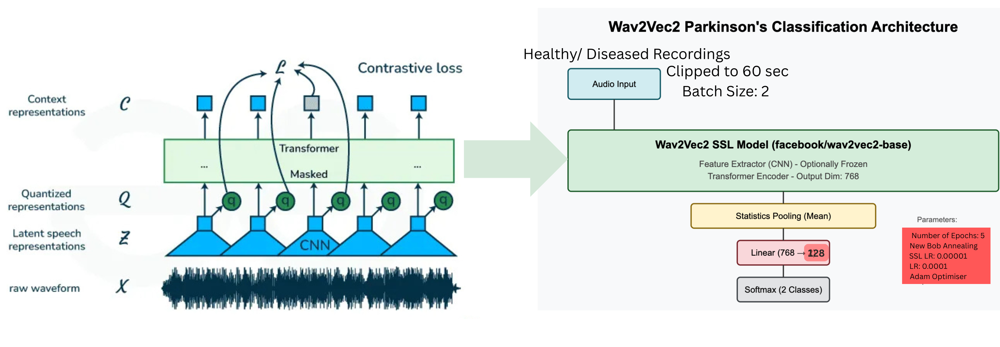

Leveraging Facebook's wav2vec2-base pre-trained model, we use transfer learning to identify subtle vocal biomarkers that may indicate Parkinson's disease.
1. The model's convolutional feature extractor remains frozen while fine-tuning the transformer layers. This strategy allows the model to adapt its powerful speech representations to the specific patterns associated with Parkinson's disease.
2. The architecture is streamlined - it takes audio input (sampled at 16kHz, with a clipped maximum duration of 60 seconds), processes it through the wav2vec2 model to obtain 768-dimensional embeddings, applies statistical pooling to get utterance-level features, and finally passes these through a simple linear classification layer to distinguish between healthy and diseased individuals.
3. Training uses a dual learning rate strategy (0.0001 for the classifier and 0.00001 for fine-tuning the SSL model) with Adam optimization and NewBob scheduling to dynamically adjust learning rates based on validation performance.
4. We use Orion to identify optimal embedding dimensions (256, 512, or 768) through hyperparameter tuning.

In [ ]:
!mkdir -p wav2vec2/orion

In [ ]:
%%file wav2vec2/orion/hparams_wav2vec.yaml

# Seed needs to be set at top of yaml, before objects with parameters are made
seed: 2023
__set_seed: !apply:torch.manual_seed [!ref <seed>]


hpopt_mode: null
hpopt: null

# Dataset will be downloaded to the `data_original`
data_folder: !ref .
output_folder: !ref ./results/Parkinson/Xvector/wav2vec2/<seed>
save_folder: !ref <output_folder>/save
train_log: !ref <output_folder>/train_log.txt

# URL for the ssl model, you can change to benchmark diffrenet models
sslmodel_hub: facebook/wav2vec2-base
sslmodel_folder: !ref <save_folder>/ssl_checkpoint

# Path where data manifest files will be stored
train_annotation: !ref <data_folder>/train.json
valid_annotation: !ref <data_folder>/valid.json
test_annotation: !ref <data_folder>/test.json

# The train logger writes training statistics to a file, as well as stdout.
train_logger: !new:speechbrain.utils.train_logger.FileTrainLogger
    save_file: !ref <train_log>


####################### Training Parameters ####################################
number_of_epochs: 5
batch_size: 2
lr: 0.0001
lr_ssl: 0.00001
sample_rate: 16000
n_classes: 2 # In this case, we have 2 types of speaker
emb_dim: 128 # dimensionality of the embeddings
ckpt_enable: False

#freeze all ssl
freeze_ssl: False
#set to true to freeze the CONV part of the ssl model
# We see an improvement of 2% with freezing CNNs
freeze_ssl_conv: True
max_seconds: 60  # Adjust based on your dataset
####################### Model Parameters #######################################
encoder_dim: 768

out_n_neurons: 2 #(diseased/healthy)

dataloader_options:
    batch_size: !ref <batch_size>
    shuffle: True
    num_workers: 2  # 2 on linux but 0 works on windows
    drop_last: True
    pin_memory: True

# ssl encoder
ssl_model: !new:speechbrain.lobes.models.huggingface_transformers.wav2vec2.Wav2Vec2
    source: !ref <sslmodel_hub>
    output_norm: True
    freeze: !ref <freeze_ssl>
    freeze_feature_extractor: !ref <freeze_ssl_conv>
    save_path: !ref <sslmodel_folder>


avg_pool: !new:speechbrain.nnet.pooling.StatisticsPooling
    return_std: False

output_mlp: !new:speechbrain.nnet.linear.Linear
    input_size: !ref <encoder_dim>
    n_neurons: !ref <out_n_neurons>
    bias: False

epoch_counter: !new:speechbrain.utils.epoch_loop.EpochCounter
    limit: !ref <number_of_epochs>

modules:
    ssl_model: !ref <ssl_model>
    output_mlp: !ref <output_mlp>

model: !new:torch.nn.ModuleList
    - [!ref <output_mlp>]

log_softmax: !new:speechbrain.nnet.activations.Softmax
    apply_log: True

compute_cost: !name:speechbrain.nnet.losses.nll_loss

error_stats: !name:speechbrain.utils.metric_stats.MetricStats
    metric: !name:speechbrain.nnet.losses.classification_error
        reduction: batch

opt_class: !name:torch.optim.Adam
    lr: !ref <lr>

ssl_opt_class: !name:torch.optim.Adam
    lr: !ref <lr_ssl>

lr_annealing: !new:speechbrain.nnet.schedulers.NewBobScheduler
    initial_value: !ref <lr>
    improvement_threshold: 0.0025
    annealing_factor: 0.9
    patient: 0

lr_annealing_ssl: !new:speechbrain.nnet.schedulers.NewBobScheduler
    initial_value: !ref <lr_ssl>
    improvement_threshold: 0.0025
    annealing_factor: 0.9

checkpointer: !new:speechbrain.utils.checkpoints.Checkpointer
    checkpoints_dir: !ref <save_folder>
    recoverables:
        model: !ref <model>
        ssl_model: !ref <ssl_model>
        lr_annealing_output: !ref <lr_annealing>
        lr_annealing_ssl: !ref <lr_annealing_ssl>
        counter: !ref <epoch_counter>


Writing wav2vec2/orion/hparams_wav2vec.yaml


In [ ]:
%%file wav2vec2/orion/train.py

#!/usr/bin/env python3
"Recipe for training a speaker type classification system."
import os
import sys
import torch
import torchaudio
import speechbrain as sb
from hyperpyyaml import load_hyperpyyaml
from speechbrain.utils import hpopt as hp



# Brain class for speech enhancement training
class SpeakerBrain(sb.Brain):
    """Class that manages the training loop. See speechbrain.core.Brain."""

    def compute_forward(self, batch, stage):
        """Runs all the computations that transforms the input into the
        output probabilities over the N classes.

        Arguments
        ---------
        batch : PaddedBatch
            This batch object contains all the relevant tensors for computation.
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        Returns
        -------
        predictions : Tensor
            Tensor that contains the posterior probabilities over the N classes.
        """
        batch = batch.to(self.device)
        wavs, lens = batch.sig

        outputs = self.modules.ssl_model(wavs, lens)

        # last dim will be used for AdaptativeAVG pool
        outputs = self.hparams.avg_pool(outputs, lens)
        outputs = outputs.view(outputs.shape[0], -1)

        outputs = self.modules.output_mlp(outputs)
        outputs = self.hparams.log_softmax(outputs)
        return outputs

    def compute_objectives(self, predictions, batch, stage):
        """Computes the loss given the predicted and targeted outputs.

        Arguments
        ---------
        predictions : tensor
            The output tensor from `compute_forward`.
        batch : PaddedBatch
            This batch object contains all the relevant tensors for computation.
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        Returns
        -------
        loss : torch.Tensor
            A one-element tensor used for backpropagating the gradient.
        """
        _, wav_lens = batch.sig
        conditions, _ = batch.condition_encoded
        conditions = conditions.squeeze(1)
        loss = self.hparams.compute_cost(predictions, conditions)
        if stage != sb.Stage.TRAIN:
            self.error_metrics.append(batch.id, predictions, conditions)
        return loss


    def on_stage_start(self, stage, epoch=None):
        """Gets called at the beginning of each epoch.
        Arguments
        ---------
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        epoch : int
            The currently-starting epoch. This is passed
            `None` during the test stage.
        """

        # Set up statistics trackers for this stage
        self.loss_metric = sb.utils.metric_stats.MetricStats(
            metric=sb.nnet.losses.nll_loss
        )

        # Set up evaluation-only statistics trackers
        if stage != sb.Stage.TRAIN:
            self.error_metrics = self.hparams.error_stats()

    def on_stage_end(self, stage, stage_loss, epoch=None):
        """Gets called at the end of an epoch.
        Arguments
        ---------
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, sb.Stage.TEST
        stage_loss : float
            The average loss for all of the data processed in this stage.
        epoch : int
            The currently-starting epoch. This is passed
            `None` during the test stage.
        """


        # Store the train loss until the validation stage.
        if stage == sb.Stage.TRAIN:
            self.train_loss = stage_loss

        # Summarize the statistics from the stage for record-keeping.
        else:
            stats = {
                "loss": stage_loss,
                "error_rate": self.error_metrics.summarize("average"),
            }

        # At the end of validation...
        if stage == sb.Stage.VALID:

            old_lr, new_lr = self.hparams.lr_annealing(stats["error_rate"])
            sb.nnet.schedulers.update_learning_rate(self.optimizer, new_lr)

            (
                old_lr_ssl,
                new_lr_ssl,
            ) = self.hparams.lr_annealing_ssl(stats["error_rate"])
            sb.nnet.schedulers.update_learning_rate(
                self.ssl_optimizer, new_lr_ssl
            )

            # The train_logger writes a summary to stdout and to the logfile.
            self.hparams.train_logger.log_stats(
                {"Epoch": epoch, "lr": old_lr, "ssl_lr": old_lr_ssl},
                train_stats={"loss": self.train_loss},
                valid_stats=stats,
            )

            hp.report_result(stats)


            # Save the current checkpoint and delete previous checkpoints,
            # self.checkpointer.save_and_keep_only(
            #     meta=stats, min_keys=["error_rate"])
            if self.hparams.ckpt_enable:
                self.checkpointer.save_and_keep_only(meta=stats, min_keys=["error_rate"])


        # We also write statistics about test data to stdout and to logfile.
        if stage == sb.Stage.TEST:
            self.hparams.train_logger.log_stats(
                {"Epoch loaded": self.hparams.epoch_counter.current},
                test_stats=stats,
            )

    def init_optimizers(self):
        "Initializes the ssl optimizer and model optimizer"
        self.ssl_optimizer = self.hparams.ssl_opt_class(
            self.modules.ssl_model.parameters()
        )
        self.optimizer = self.hparams.opt_class(self.hparams.model.parameters())

        if self.checkpointer is not None:
            self.checkpointer.add_recoverable(
                "ssl_opt", self.ssl_optimizer
            )
            self.checkpointer.add_recoverable("optimizer", self.optimizer)

        self.optimizers_dict = {
            "model_optimizer": self.optimizer,
            "ssl_optimizer": self.ssl_optimizer,
        }



def dataio_prep(hparams):
    """This function prepares the datasets to be used in the brain class.
    It also defines the data processing pipeline through user-defined functions.
    We expect `prepare_mini_librispeech` to have been called before this,
    so that the `train.json`, `valid.json`,  and `valid.json` manifest files
    are available.
    Arguments
    ---------
    hparams : dict
        This dictionary is loaded from the `train.yaml` file, and it includes
        all the hyperparameters needed for dataset construction and loading.
    Returns
    -------
    datasets : dict
        Contains two keys, "train" and "valid" that correspond
        to the appropriate DynamicItemDataset object.
    """

    # Initialization of the label encoder.
    label_encoder = sb.dataio.encoder.CategoricalEncoder()

    # Define audio pipeline
    @sb.utils.data_pipeline.takes("path")
    @sb.utils.data_pipeline.provides("sig")
    def audio_pipeline(wav):
        """Load the signal, and pass it and its length to the corruption class.
        This is done on the CPU in the `collate_fn`."""
        sig, fs = torchaudio.load(wav)

        sig = torchaudio.functional.resample(sig, fs, hparams["sample_rate"])
        sig = sig.squeeze()
        max_samples = hparams["sample_rate"] * hparams["max_seconds"]  # e.g., 16000 * 5 = 5 sec
        sig = sig[:max_samples]  # Truncate
        return sig

    # Define label pipeline:
    @sb.utils.data_pipeline.takes("condition")
    @sb.utils.data_pipeline.provides("condition", "condition_encoded")
    def label_pipeline(condition):
        """Defines the pipeline to process the language labels.
        Note that we have to assign a different integer to each class
        through the label encoder.
        """
        yield condition
        condition_encoded = label_encoder.encode_label_torch(condition)
        yield condition_encoded

    # Define datasets. We also connect the dataset with the data processing
    # functions defined above.
    datasets = {}
    data_info = {
        "train": hparams["train_annotation"],
        "valid": hparams["valid_annotation"],
        "test": hparams["test_annotation"],
    }
    hparams["dataloader_options"]["shuffle"] = True
    for dataset in data_info:
        datasets[dataset] = sb.dataio.dataset.DynamicItemDataset.from_json(
            json_path=data_info[dataset],
            dynamic_items=[audio_pipeline, label_pipeline],
            output_keys=["id", "sig", "condition_encoded"],
        )

    # Load or compute the label encoder (with multi-GPU DDP support)
    # Please, take a look into the lab_enc_file to see the label to index
    # mapping.
    lab_enc_file = os.path.join(hparams["save_folder"], "label_encoder.txt")
    label_encoder.load_or_create(
        path=lab_enc_file,
        from_didatasets=[datasets["train"]],
        output_key="condition",
    )

    return datasets


# Recipe begins!
if __name__ == "__main__":
    with hp.hyperparameter_optimization(objective_key="error_rate") as hp_ctx: # <-- Initialize the context
        hparams_file, run_opts, overrides = hp_ctx.parse_arguments(sys.argv[1:]) # <-- Replace sb with hp_ctx
        # Reading command line arguments.
        # hparams_file, run_opts, overrides = sb.parse_arguments(sys.argv[1:])

        # Load hyperparameters file with command-line overrides.
        with open(hparams_file) as fin:
            hparams = load_hyperpyyaml(fin,  overrides)
        print(hparams["encoder_dim"])

        # Create experiment directory
        sb.create_experiment_directory(
            experiment_directory=hparams["output_folder"],
            hyperparams_to_save=hparams_file,
            overrides=overrides,
        )

        # Create dataset objects "train", "valid", and "test".
        datasets = dataio_prep(hparams)

        # Initialize the Brain object to prepare for mask training.
        speaker_brain = SpeakerBrain(
            modules=hparams["modules"],
            opt_class=hparams["opt_class"],
            hparams=hparams,
            run_opts=run_opts,
            checkpointer=hparams["checkpointer"],
        )

        # The `fit()` method iterates the training loop, calling the methods
        # necessary to update the parameters of the model. Since all objects
        # with changing state are managed by the Checkpointer, training can be
        # stopped at any point, and will be resumed on next call.
        speaker_brain.fit(
            epoch_counter=speaker_brain.hparams.epoch_counter,
            train_set=datasets["train"],
            valid_set=datasets["valid"],
            train_loader_kwargs=hparams["dataloader_options"],
            valid_loader_kwargs=hparams["dataloader_options"],
        )

        # Load the best checkpoint for evaluation
        test_stats = speaker_brain.evaluate(
            test_set=datasets["test"],
            min_key="error",
            test_loader_kwargs=hparams["dataloader_options"],
        )

Overwriting wav2vec2/orion/train.py


In [ ]:
!rm -rf ./results/Parkinson/Xvector/wav2vec2/1989

# !python train.py hparams_wav2vec.yaml  --number_of_epochs=5 --device='cuda:0'
HPOPT_CONFIG_FILE="~/config/orion-speaker-id.yaml"
!orion hunt -n wav2vec2-12 -c $HPOPT_CONFIG_FILE python wav2vec2/orion/train.py wav2vec2/orion/hparams_wav2vec.yaml \
  --hpopt=True \
  --hpopt_mode orion \
  --emb_dim~"choices([256,512,768])"

2025-04-24 18:25:57,826::WARNING::root::Script /content/wav2vec2/orion/train.py is not in a git repository. Code modification won't be detected.
2025-04-24 18:25:57,978::WARNING::root::Script /content/wav2vec2/orion/train.py is not in a git repository. Code modification won't be detected.
2025-04-24 18:25:58,055::WARNING::orion.core.io.experiment_builder::algorithms is deprecated and will be removed in v0.4.0. Use algorithm instead.
2025-04-24 18:25:58,091::WARNING::root::Script /content/wav2vec2/orion/train.py is not in a git repository. Code modification won't be detected.
2025-04-24 18:25:59,541::WARNING::root::Script /content/wav2vec2/orion/train.py is not in a git repository. Code modification won't be detected.
2025-04-24 18:26:07.565053: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745519167.826096   15627 cuda_dnn.cc:8310] Unable 

# **WavLM**
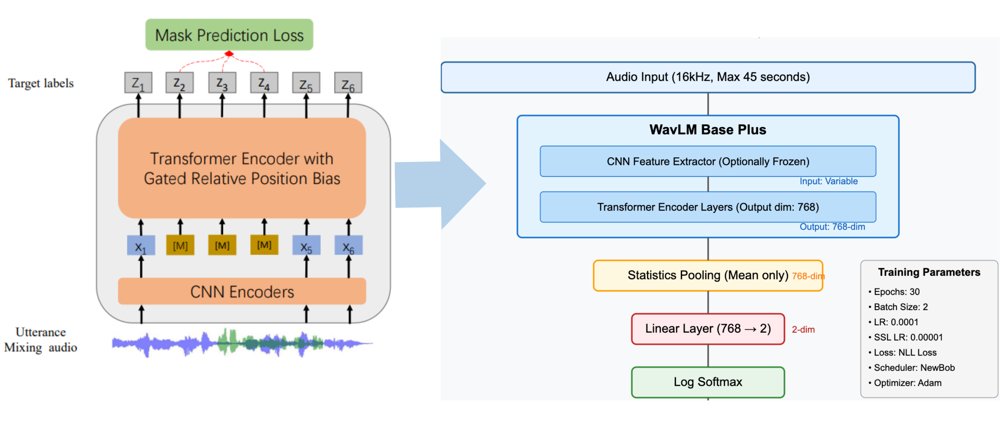

Fine-tuned WavLM model (microsoft/wavlm-base-plus) for speech feature extraction
#### Training Approach:
1. Transfer learning with pre-trained SSL (Self-Supervised Learning) speech model
2. Two-stage optimization process with separate learning rates for SSL model and classifier

#### Hyperparameters & Architecture Details

##### Training Configuration:

1. Epochs: 30
2. Batch size: 2
3. Learning rates: 0.0001 (classifier), 0.00001 (SSL model)
4. Audio processing: 16kHz sample rate, max 45 seconds per clip
5. SSL freezing strategy: Feature extractor (conv layers) frozen, transformer layers trainable


##### Model Components:

1. Encoder: WavLM with 768-dimensional embeddings
2. Pooling: Statistical pooling (mean only)
3. Classifier: Single linear layer without bias
4. Loss function: Negative log-likelihood
5. Metric: Classification error rate


##### Optimization:

1. Optimizer: Adam
2. Learning rate scheduler: NewBobScheduler
   * Reduces learning rate by factor of 0.9 when improvement drops below 0.25%
   * Applied separately to SSL model and classifier components

In [ ]:
%%file hparams_ssl.yaml

# Seed needs to be set at top of yaml, before objects with parameters are made
seed: 2023
__set_seed: !apply:torch.manual_seed [!ref <seed>]


# Dataset will be downloaded to the `data_original`
data_folder: !ref .
output_folder: !ref ./results/Parkinson/Xvector/wavlm/<seed>
save_folder: !ref <output_folder>/save
train_log: !ref <output_folder>/train_log.txt

# URL for the wavllm model whicih will be fine tuned
sslmodel_hub: microsoft/wavlm-base-plus
sslmodel_folder: !ref <save_folder>/ssl_checkpoint

# Path where data manifest files will be stored
train_annotation: !ref <data_folder>/train.json
valid_annotation: !ref <data_folder>/valid.json
test_annotation: !ref <data_folder>/test.json

# The train logger writes training statistics to a file, as well as stdout.
train_logger: !new:speechbrain.utils.train_logger.FileTrainLogger
    save_file: !ref <train_log>


####################### Training Parameters ####################################
number_of_epochs: 30
batch_size: 2
lr: 0.0001
lr_ssl: 0.00001
sample_rate: 16000
#to clip longer audio files to seconds
max_seconds: 45

#freeze all ssl
freeze_ssl: False
#set to true to freeze the CONV part of the ssl model
freeze_ssl_conv: True

####################### Model Parameters #######################################
encoder_dim: 768

# Number of emotions
out_n_neurons: 2 # (diseased, healthy)

dataloader_options:
    batch_size: !ref <batch_size>
    shuffle: True
    num_workers: 2  # 2 on linux but 0 works on windows
    drop_last: False

# ssl encoder
ssl_model: !new:speechbrain.lobes.models.huggingface_transformers.wavlm.WavLM
    source: !ref <sslmodel_hub>
    output_norm: True
    freeze: !ref <freeze_ssl>
    freeze_feature_extractor: !ref <freeze_ssl_conv>
    save_path: !ref <sslmodel_folder>

avg_pool: !new:speechbrain.nnet.pooling.StatisticsPooling
    return_std: False

output_mlp: !new:speechbrain.nnet.linear.Linear
    input_size: !ref <encoder_dim>
    n_neurons: !ref <out_n_neurons>
    bias: False

epoch_counter: !new:speechbrain.utils.epoch_loop.EpochCounter
    limit: !ref <number_of_epochs>

modules:
    ssl_model: !ref <ssl_model>
    output_mlp: !ref <output_mlp>

model: !new:torch.nn.ModuleList
    - [!ref <output_mlp>]

log_softmax: !new:speechbrain.nnet.activations.Softmax
    apply_log: True

compute_cost: !name:speechbrain.nnet.losses.nll_loss

error_stats: !name:speechbrain.utils.metric_stats.MetricStats
    metric: !name:speechbrain.nnet.losses.classification_error
        reduction: batch

opt_class: !name:torch.optim.Adam
    lr: !ref <lr>

ssl_opt_class: !name:torch.optim.Adam
    lr: !ref <lr_ssl>

lr_annealing: !new:speechbrain.nnet.schedulers.NewBobScheduler
    initial_value: !ref <lr>
    improvement_threshold: 0.0025
    annealing_factor: 0.9
    patient: 0

lr_annealing_ssl: !new:speechbrain.nnet.schedulers.NewBobScheduler
    initial_value: !ref <lr_ssl>
    improvement_threshold: 0.0025
    annealing_factor: 0.9

checkpointer: !new:speechbrain.utils.checkpoints.Checkpointer
    checkpoints_dir: !ref <save_folder>
    recoverables:
        model: !ref <model>
        ssl_model: !ref <ssl_model>
        lr_annealing_output: !ref <lr_annealing>
        lr_annealing_ssl: !ref <lr_annealing_ssl>
        counter: !ref <epoch_counter>

Overwriting hparams_ssl.yaml


In [ ]:
%%file train.py

#!/usr/bin/env python3
"Recipe for training a speaker type classification system."
import os
import sys
import torch
import torchaudio
import speechbrain as sb
from hyperpyyaml import load_hyperpyyaml


# Brain class for speech enhancement training
class SpeakerBrain(sb.Brain):
    """Class that manages the training loop. See speechbrain.core.Brain."""

    def compute_forward(self, batch, stage):
        """Runs all the computations that transforms the input into the
        output probabilities over the N classes.

        Arguments
        ---------
        batch : PaddedBatch
            This batch object contains all the relevant tensors for computation.
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        Returns
        -------
        predictions : Tensor
            Tensor that contains the posterior probabilities over the N classes.
        """
        batch = batch.to(self.device)
        wavs, lens = batch.sig

        outputs = self.modules.ssl_model(wavs, lens)

        # last dim will be used for AdaptativeAVG pool
        outputs = self.hparams.avg_pool(outputs, lens)
        outputs = outputs.view(outputs.shape[0], -1)

        outputs = self.modules.output_mlp(outputs)
        outputs = self.hparams.log_softmax(outputs)
        return outputs

    def compute_objectives(self, predictions, batch, stage):
        """Computes the loss given the predicted and targeted outputs.

        Arguments
        ---------
        predictions : tensor
            The output tensor from `compute_forward`.
        batch : PaddedBatch
            This batch object contains all the relevant tensors for computation.
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        Returns
        -------
        loss : torch.Tensor
            A one-element tensor used for backpropagating the gradient.
        """
        _, wav_lens = batch.sig
        conditions, _ = batch.condition_encoded
        conditions = conditions.squeeze(1)
        loss = self.hparams.compute_cost(predictions, conditions)
        if stage != sb.Stage.TRAIN:
            self.error_metrics.append(batch.id, predictions, conditions)
        return loss


    def on_stage_start(self, stage, epoch=None):
        """Gets called at the beginning of each epoch.
        Arguments
        ---------
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        epoch : int
            The currently-starting epoch. This is passed
            `None` during the test stage.
        """

        # Set up statistics trackers for this stage
        self.loss_metric = sb.utils.metric_stats.MetricStats(
            metric=sb.nnet.losses.nll_loss
        )

        # Set up evaluation-only statistics trackers
        if stage != sb.Stage.TRAIN:
            self.error_metrics = self.hparams.error_stats()

    def on_stage_end(self, stage, stage_loss, epoch=None):
        """Gets called at the end of an epoch.
        Arguments
        ---------
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, sb.Stage.TEST
        stage_loss : float
            The average loss for all of the data processed in this stage.
        epoch : int
            The currently-starting epoch. This is passed
            `None` during the test stage.
        """


        # Store the train loss until the validation stage.
        if stage == sb.Stage.TRAIN:
            self.train_loss = stage_loss

        # Summarize the statistics from the stage for record-keeping.
        else:
            stats = {
                "loss": stage_loss,
                "error_rate": self.error_metrics.summarize("average"),
            }

        # At the end of validation...
        if stage == sb.Stage.VALID:

            old_lr, new_lr = self.hparams.lr_annealing(stats["error_rate"])
            sb.nnet.schedulers.update_learning_rate(self.optimizer, new_lr)

            (
                old_lr_ssl,
                new_lr_ssl,
            ) = self.hparams.lr_annealing_ssl(stats["error_rate"])
            sb.nnet.schedulers.update_learning_rate(
                self.ssl_optimizer, new_lr_ssl
            )

            # The train_logger writes a summary to stdout and to the logfile.
            self.hparams.train_logger.log_stats(
                {"Epoch": epoch, "lr": old_lr, "ssl_lr": old_lr_ssl},
                train_stats={"loss": self.train_loss},
                valid_stats=stats,
            )

            # Save the current checkpoint and delete previous checkpoints,
            self.checkpointer.save_and_keep_only(
                meta=stats, min_keys=["error_rate"]
            )

        # We also write statistics about test data to stdout and to logfile.
        if stage == sb.Stage.TEST:
            self.hparams.train_logger.log_stats(
                {"Epoch loaded": self.hparams.epoch_counter.current},
                test_stats=stats,
            )

    def init_optimizers(self):
        "Initializes the ssl optimizer and model optimizer"
        self.ssl_optimizer = self.hparams.ssl_opt_class(
            self.modules.ssl_model.parameters()
        )
        self.optimizer = self.hparams.opt_class(self.hparams.model.parameters())

        if self.checkpointer is not None:
            self.checkpointer.add_recoverable(
                "ssl_opt", self.ssl_optimizer
            )
            self.checkpointer.add_recoverable("optimizer", self.optimizer)

        self.optimizers_dict = {
            "model_optimizer": self.optimizer,
            "ssl_optimizer": self.ssl_optimizer,
        }



def dataio_prep(hparams):
    """This function prepares the datasets to be used in the brain class.
    It also defines the data processing pipeline through user-defined functions.
    It is expected that all JSON files are already created and avaliable
    Arguments
    ---------
    hparams : dict
        This dictionary is loaded from the `train.yaml` file, and it includes
        all the hyperparameters needed for dataset construction and loading.
    Returns
    -------
    datasets : dict
        Contains two keys, "train" and "valid" that correspond
        to the appropriate DynamicItemDataset object.
    """

    # Initialization of the label encoder.
    label_encoder = sb.dataio.encoder.CategoricalEncoder()

    # Define audio pipeline
    @sb.utils.data_pipeline.takes("path")
    @sb.utils.data_pipeline.provides("sig")
    def audio_pipeline(wav):
        """Load the signal, and pass it and its length to the corruption class.
        This is done on the CPU in the `collate_fn`."""
        sig, fs = torchaudio.load(wav)

        sig = torchaudio.functional.resample(sig, fs, hparams["sample_rate"])
        sig = sig.squeeze()
        max_samples = hparams["sample_rate"] * hparams["max_seconds"]
        sig = sig[:max_samples]  # Truncate
        return sig

    # Define label pipeline:
    @sb.utils.data_pipeline.takes("condition")
    @sb.utils.data_pipeline.provides("condition", "condition_encoded")
    def label_pipeline(condition):
        """Defines the pipeline to process the language labels.
        Note that we have to assign a different integer to each class
        through the label encoder.
        """
        yield condition
        condition_encoded = label_encoder.encode_label_torch(condition)
        yield condition_encoded

    # Define datasets. We also connect the dataset with the data processing
    # functions defined above.
    datasets = {}
    data_info = {
        "train": hparams["train_annotation"],
        "valid": hparams["valid_annotation"],
        "test": hparams["test_annotation"],
    }
    hparams["dataloader_options"]["shuffle"] = True
    for dataset in data_info:
        datasets[dataset] = sb.dataio.dataset.DynamicItemDataset.from_json(
            json_path=data_info[dataset],
            dynamic_items=[audio_pipeline, label_pipeline],
            output_keys=["id", "sig", "condition_encoded"],
        )

    # Load or compute the label encoder (with multi-GPU DDP support)
    lab_enc_file = os.path.join(hparams["save_folder"], "label_encoder.txt")
    label_encoder.load_or_create(
        path=lab_enc_file,
        from_didatasets=[datasets["train"]],
        output_key="condition",
    )

    return datasets


# Recipe begins!
if __name__ == "__main__":

    # Reading command line arguments.
    hparams_file, run_opts, overrides = sb.parse_arguments(sys.argv[1:])

    # Load hyperparameters file with command-line overrides.
    with open(hparams_file) as fin:
        hparams = load_hyperpyyaml(fin,  overrides)

    # Create experiment directory
    sb.create_experiment_directory(
        experiment_directory=hparams["output_folder"],
        hyperparams_to_save=hparams_file,
        overrides=overrides,
    )

    # Create dataset objects "train", "valid", and "test".
    datasets = dataio_prep(hparams)

    # Initialize the Brain object to prepare for mask training.
    speaker_brain = SpeakerBrain(
        modules=hparams["modules"],
        opt_class=hparams["opt_class"],
        hparams=hparams,
        run_opts=run_opts,
        checkpointer=hparams["checkpointer"],
    )

    # The `fit()` method iterates the training loop, calling the methods
    # necessary to update the parameters of the model. Since all objects
    # with changing state are managed by the Checkpointer, training can be
    # stopped at any point, and will be resumed on next call.
    speaker_brain.fit(
        epoch_counter=speaker_brain.hparams.epoch_counter,
        train_set=datasets["train"],
        valid_set=datasets["valid"],
        train_loader_kwargs=hparams["dataloader_options"],
        valid_loader_kwargs=hparams["dataloader_options"],
    )

    # Load the best checkpoint for evaluation
    test_stats = speaker_brain.evaluate(
        test_set=datasets["test"],
        min_key="error",
        test_loader_kwargs=hparams["dataloader_options"],
    )

Overwriting train.py


In [ ]:
!rm -rf ./results/Parkinson/Xvector/wavlm/2023

!python train.py hparams_ssl.yaml --device='cuda:0' --number_of_epochs=2

2025-04-23 20:50:31.879893: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745441431.900567   18259 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745441431.906769   18259 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-23 20:50:31.928689: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
config.json: 100% 2.23k/2.23k [00:00<00:00, 17.0MB/s]
pytorch_model.bin: 100% 378M/378M [00:01<00:00, 238MB/s]
preprocessor_c

# **ECAPA TDNN**
ECAPA-TDNN (Emphasized Channel Attention, Propagation and Aggregation Time Delay Neural Network)

##### Training Configuration:

1. Epochs: 30
2. Batch size: 4
3. Learning rate: Linear decay from 0.0001 to 0.00001
4. Audio processing: 16kHz sample rate, max 20 seconds per clip
5. Feature extraction: 80-dimensional Mel filterbank features


##### Model Components:

1. Embedding network: ECAPA-TDNN with 5 blocks and embedding dimension of 192
2. Channel configuration: [1024, 1024, 1024, 1024, 3072]
3. Attention channels: 128
4. Classifier: Additive Angular Margin-based classifier (margin: 0.2, scale: 30)


##### Data Augmentation:
Multi-faceted augmentation pipeline (1-3 augmentations applied):
1. Reverberation (RIR-based)
2. Noise addition (SNR: 0-15dB)
3. Speed perturbation

**NOTE:** Original samples are also included with augmented versions


##### Optimization:
1. Adam optimizer with weight decay (0.000002)
2. Pretrained model initialization: VoxCeleb speaker recognition embeddings

In [ ]:
# #################################
# Training ECAPA-TDNN embeddings for language identification (LID).
# #################################
%%file hparams_ecapa.yaml

# Seed needs to be set at top of yaml, before objects with parameters are made
seed: 2023
__set_seed: !apply:speechbrain.utils.seed_everything [!ref <seed>]

# Set up folders for reading from and writing to
# Dataset will be downloaded to the `data_folder`
data_folder: !ref . # e.g. /localscratch/common_voice_kpd/
output_folder: !ref results/ECAPA-TDNN/<seed>
save_folder: !ref <output_folder>/save
train_log: !ref <output_folder>/train_log.txt
skip_prep: False

train_annotation: !ref <data_folder>/train.json
valid_annotation: !ref <data_folder>/valid.json
test_annotation: !ref <data_folder>/test.json

# Data for augmentation
NOISE_DATASET_URL: https://www.dropbox.com/scl/fi/a09pj97s5ifan81dqhi4n/noises.zip?rlkey=j8b0n9kdjdr32o1f06t0cw5b7&dl=1
RIR_DATASET_URL: https://www.dropbox.com/scl/fi/linhy77c36mu10965a836/RIRs.zip?rlkey=pg9cu8vrpn2u173vhiqyu743u&dl=1
data_folder_noise: !ref <data_folder>/noise # The noisy sequences for data augmentation will automatically be downloaded here.
data_folder_rir: !ref <data_folder>/rir # The impulse responses used for data augmentation will automatically be downloaded here.
noise_annotation: !ref <save_folder>/noise.csv
rir_annotation: !ref <save_folder>/rir.csv

# The train logger writes training statistics to a file, as well as stdout.
train_logger: !new:speechbrain.utils.train_logger.FileTrainLogger
    save_file: !ref <train_log>

error_stats: !name:speechbrain.utils.metric_stats.MetricStats
    metric: !name:speechbrain.nnet.losses.classification_error
        reduction: batch

####################### Training Parameters ####################################

# Feature parameters btw: 40 - 80
n_mels: 80
sample_rate: 16000
number_of_epochs: 30
batch_size: 4
n_languages: 2
emb_dim: 192 # dimensionality of the embeddings
emb_channels: [1024, 1024, 1024, 1024, 3072]
emb_attention_channels: 128
max_seconds: 20

# Dataloaders
num_workers: 4
drop_last: True
train_dataloader_options:
    num_workers: !ref <num_workers>
    batch_size: !ref <batch_size>
    drop_last: !ref <drop_last>
    shuffle: True

test_dataloader_options:
    num_workers: !ref <num_workers>
    batch_size: !ref <batch_size>
    shuffle: True

############################## Augmentations ###################################

# Download and prepare the dataset of noisy sequences for augmentation
prepare_noise_data: !name:speechbrain.augment.preparation.prepare_dataset_from_URL
    URL: !ref <NOISE_DATASET_URL>
    dest_folder: !ref <data_folder_noise>
    ext: wav
    csv_file: !ref <noise_annotation>

# Download and prepare the dataset of room impulse responses for augmentation
prepare_rir_data: !name:speechbrain.augment.preparation.prepare_dataset_from_URL
    URL: !ref <RIR_DATASET_URL>
    dest_folder: !ref <data_folder_rir>
    ext: wav
    csv_file: !ref <rir_annotation>

# Add reverberation to input signal
add_reverb: !new:speechbrain.augment.time_domain.AddReverb
    csv_file: !ref <rir_annotation>
    reverb_sample_rate: !ref <sample_rate>
    clean_sample_rate: !ref <sample_rate>
    num_workers: !ref <num_workers>

# Add noise to input signal
add_noise: !new:speechbrain.augment.time_domain.AddNoise
    csv_file: !ref <noise_annotation>
    snr_low: 0
    snr_high: 15
    noise_sample_rate: !ref <sample_rate>
    clean_sample_rate: !ref <sample_rate>
    num_workers: !ref <num_workers>

# Speed perturbation
speed_perturb: !new:speechbrain.augment.time_domain.SpeedPerturb
    orig_freq: !ref <sample_rate>

# Augmenter: Combines previously defined augmentations to perform data augmentation
wav_augment: !new:speechbrain.augment.augmenter.Augmenter
    concat_original: True
    shuffle_augmentations: True
    min_augmentations: 1
    max_augmentations: 3
    augmentations: [
        !ref <add_reverb>,
        !ref <add_noise>,
        !ref <speed_perturb>]

# Feature extraction
compute_features: !new:speechbrain.lobes.features.Fbank
    n_mels: !ref <n_mels>

# Mean and std normalization of the input features
mean_var_norm_input: !new:speechbrain.processing.features.InputNormalization
    norm_type: sentence
    std_norm: False

############################## Models ##########################################

# To design a custom model, either just edit the simple CustomModel
# class that's listed here, or replace this `!new` call with a line
# pointing to a different file you've defined.

dataloader_options:
    batch_size: !ref <batch_size>
    shuffle: True
    num_workers: 2  # 2 on linux but 0 works on windows
    drop_last: False

# Embedding Model
embedding_model: !new:speechbrain.lobes.models.ECAPA_TDNN.ECAPA_TDNN
    input_size: !ref <n_mels>
    activation: !name:torch.nn.LeakyReLU
    channels: !ref <emb_channels>
    kernel_sizes: [5, 3, 3, 3, 1]
    dilations: [1, 2, 3, 4, 1]
    attention_channels: !ref <emb_attention_channels>
    lin_neurons: !ref <emb_dim>

# Classifier based on cosine distance
classifier: !new:speechbrain.lobes.models.ECAPA_TDNN.Classifier
    input_size: !ref <emb_dim>
    out_neurons: !ref <n_languages>

# The first object passed to the Brain class is this "Epoch Counter"
# which is saved by the Checkpointer so that training can be resumed
# if it gets interrupted at any point.
epoch_counter: !new:speechbrain.utils.epoch_loop.EpochCounter
    limit: !ref <number_of_epochs>

# Objects in "modules" dict will have their parameters moved to the correct
# device, as well as having train()/eval() called on them by the Brain class.
modules:
    compute_features: !ref <compute_features>
    embedding_model: !ref <embedding_model>
    mean_var_norm_input: !ref <mean_var_norm_input>
    classifier: !ref <classifier>

# Additive Angular Margin
compute_cost: !new:speechbrain.nnet.losses.LogSoftmaxWrapper
    loss_fn: !new:speechbrain.nnet.losses.AdditiveAngularMargin
        margin: 0.2
        scale: 30

# Learning rates
lr: 0.0001
lr_final: 0.00001

# This optimizer will be constructed by the Brain class after all parameters
# are moved to the correct device. Then it will be added to the checkpointer.
opt_class: !name:torch.optim.Adam
    lr: !ref <lr>
    weight_decay: 0.000002


# Linear lr decay
lr_annealing: !new:speechbrain.nnet.schedulers.LinearScheduler
    initial_value: !ref <lr>
    final_value: !ref <lr_final>
    epoch_count: !ref <number_of_epochs>

############################## Logging and Pretrainer ##########################

# This object is used for saving the state of training both so that it
# can be resumed if it gets interrupted, and also so that the best checkpoint
# can be later loaded for evaluation or inference.
checkpointer: !new:speechbrain.utils.checkpoints.Checkpointer
    checkpoints_dir: !ref <save_folder>
    recoverables:
        normalizer_input: !ref <mean_var_norm_input>
        embedding_model: !ref <embedding_model>
        classifier: !ref <classifier>
        counter: !ref <epoch_counter>

# Load pretrained embedding module
# Note: in this case, we pre-train with the ECAPA-TDNN model trained on voxceleb
# for speaker-id (this leads to a performance improvement).
embedding_model_path: speechbrain/spkrec-ecapa-voxceleb/embedding_model.ckpt

# Pretrained ECAPA embeddings from SpeakerID on VoxCeleb
pretrainer: !new:speechbrain.utils.parameter_transfer.Pretrainer
    collect_in: !ref <save_folder>
    loadables:
        embedding_model: !ref <embedding_model>
    paths:
        embedding_model: !ref <embedding_model_path>

Overwriting hparams_ecapa.yaml


In [ ]:
%%file train.py

#!/usr/bin/env python3
import os
import sys

import torchaudio
from hyperpyyaml import load_hyperpyyaml

import speechbrain as sb
from speechbrain.utils.logger import get_logger

"""Recipe for training a LID system with CommonLanguage.

To run this recipe, do the following:
> python train.py hparams/train_ecapa_tdnn.yaml
"""

logger = get_logger(__name__)


# Brain class for Language ID training
class LID(sb.Brain):
    def prepare_features(self, wavs, stage):
        """Prepare the features for computation, including augmentation.

        Arguments
        ---------
        wavs : tuple
            Input signals (tensor) and their relative lengths (tensor).
        stage : sb.Stage
            The current stage of training.

        Returns
        -------
        feats : torch.Tensor
            Computed features.
        lens : torch.Tensor
            The length of the corresponding features.
        """
        wavs, lens = wavs

        # Add waveform augmentation if specified.
        if stage == sb.Stage.TRAIN and hasattr(self.hparams, "wav_augment"):
            wavs, lens = self.hparams.wav_augment(wavs, lens)

        # Feature extraction and normalization
        feats = self.modules.compute_features(wavs)
        feats = self.modules.mean_var_norm_input(feats, lens)

        return feats, lens

    def compute_forward(self, batch, stage):
        """Runs all the computation of that transforms the input into the
        output probabilities over the N classes.

        Arguments
        ---------
        batch : PaddedBatch
            This batch object contains all the relevant tensors for computation.
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.

        Returns
        -------
        predictions : torch.Tensor
            torch.Tensor that contains the posterior probabilities over the N classes.
        """

        # We first move the batch to the appropriate device.
        batch = batch.to(self.device)

        # Compute features, embeddings and output
        feats, lens = self.prepare_features(batch.sig, stage)
        embeddings = self.modules.embedding_model(feats)
        outputs = self.modules.classifier(embeddings)

        return outputs, lens

    def compute_objectives(self, inputs, batch, stage):
        """Computes the loss given the predicted and targeted outputs.

        Arguments
        ---------
        inputs : tensors
            The output tensors from `compute_forward`.
        batch : PaddedBatch
            This batch object contains all the relevant tensors for computation.
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.

        Returns
        -------
        loss : torch.Tensor
            A one-element tensor used for backpropagating the gradient.
        """

        predictions, lens = inputs

        targets = batch.condition_encoded.data

        # Concatenate labels (due to data augmentation)
        if stage == sb.Stage.TRAIN:
            if hasattr(self.hparams, "wav_augment"):
                targets = self.hparams.wav_augment.replicate_labels(targets)
                if hasattr(self.hparams.lr_annealing, "on_batch_end"):
                    self.hparams.lr_annealing.on_batch_end(self.optimizer)

        loss = self.hparams.compute_cost(predictions, targets)

        if stage != sb.Stage.TRAIN:
            self.error_metrics.append(batch.id, predictions, targets, lens)

        return loss

    def on_stage_start(self, stage, epoch=None):
        """Gets called at the beginning of each epoch.

        Arguments
        ---------
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, or sb.Stage.TEST.
        epoch : int
            The currently-starting epoch. This is passed
            `None` during the test stage.
        """

        # Set up evaluation-only statistics trackers
        if stage != sb.Stage.TRAIN:
            self.error_metrics = self.hparams.error_stats()

    def on_stage_end(self, stage, stage_loss, epoch=None):
        """Gets called at the end of an epoch.

        Arguments
        ---------
        stage : sb.Stage
            One of sb.Stage.TRAIN, sb.Stage.VALID, sb.Stage.TEST
        stage_loss : float
            The average loss for all of the data processed in this stage.
        epoch : int
            The currently-starting epoch. This is passed
            `None` during the test stage.
        """

        # Store the train loss until the validation stage.
        if stage == sb.Stage.TRAIN:
            self.train_loss = stage_loss

        # Summarize the statistics from the stage for record-keeping.
        else:
            stats = {
                "loss": stage_loss,
                "error": self.error_metrics.summarize("average"),
            }

        # At the end of validation...
        if stage == sb.Stage.VALID:
            old_lr, new_lr = self.hparams.lr_annealing(epoch)
            sb.nnet.schedulers.update_learning_rate(self.optimizer, new_lr)

            # The train_logger writes a summary to stdout and to the logfile.
            self.hparams.train_logger.log_stats(
                {"Epoch": epoch, "lr": old_lr},
                train_stats={"loss": self.train_loss},
                valid_stats=stats,
            )

            # Save the current checkpoint and delete previous checkpoints,
            self.checkpointer.save_and_keep_only(meta=stats, min_keys=["error"])

        # We also write statistics about test data to stdout and to the logfile.
        if stage == sb.Stage.TEST:
            self.hparams.train_logger.log_stats(
                {"Epoch loaded": self.hparams.epoch_counter.current},
                test_stats=stats,
            )


def dataio_prep(hparams):
    """This function prepares the datasets to be used in the brain class.
    It also defines the data processing pipeline through user-defined functions.
    We expect `prepare_mini_librispeech` to have been called before this,
    so that the `train.json`, `valid.json`,  and `valid.json` manifest files
    are available.
    Arguments
    ---------
    hparams : dict
        This dictionary is loaded from the `train.yaml` file, and it includes
        all the hyperparameters needed for dataset construction and loading.
    Returns
    -------
    datasets : dict
        Contains two keys, "train" and "valid" that correspond
        to the appropriate DynamicItemDataset object.
    """

    # Initialization of the label encoder.
    label_encoder = sb.dataio.encoder.CategoricalEncoder()

    # Define audio pipeline
    @sb.utils.data_pipeline.takes("path")
    @sb.utils.data_pipeline.provides("sig")
    def audio_pipeline(wav):
        """Load the signal, and pass it and its length to the corruption class.
        This is done on the CPU in the `collate_fn`."""
        sig, fs = torchaudio.load(wav)

        sig = torchaudio.functional.resample(sig, fs, hparams["sample_rate"])
        sig = sig.squeeze()
        max_samples = hparams["sample_rate"] * hparams["max_seconds"]  # e.g., 16000 * 5 = 5 sec
        sig = sig[:max_samples]  # Truncate
        return sig

    # Define label pipeline:
    @sb.utils.data_pipeline.takes("condition")
    @sb.utils.data_pipeline.provides("condition", "condition_encoded")
    def label_pipeline(condition):
        """Defines the pipeline to process the language labels.
        Note that we have to assign a different integer to each class
        through the label encoder.
        """
        yield condition
        condition_encoded = label_encoder.encode_label_torch(condition)
        yield condition_encoded

    # Define datasets. We also connect the dataset with the data processing
    # functions defined above.
    datasets = {}
    data_info = {
        "train": hparams["train_annotation"],
        "valid": hparams["valid_annotation"],
        "test": hparams["test_annotation"],
    }
    hparams["dataloader_options"]["shuffle"] = True
    for dataset in data_info:
        datasets[dataset] = sb.dataio.dataset.DynamicItemDataset.from_json(
            json_path=data_info[dataset],
            dynamic_items=[audio_pipeline, label_pipeline],
            output_keys=["id", "sig", "condition_encoded"],
        )

    # Load or compute the label encoder (with multi-GPU DDP support)
    lab_enc_file = os.path.join(hparams["save_folder"], "label_encoder.txt")
    label_encoder.load_or_create(
        path=lab_enc_file,
        from_didatasets=[datasets["train"]],
        output_key="condition",
    )

    return datasets, label_encoder


# Recipe begins!
if __name__ == "__main__":
    # Reading command line arguments.
    hparams_file, run_opts, overrides = sb.parse_arguments(sys.argv[1:])

    # Initialize ddp (useful only for multi-GPU DDP training).
    sb.utils.distributed.ddp_init_group(run_opts)

    # Load hyperparameters file with command-line overrides.
    with open(hparams_file, encoding="utf-8") as fin:
        hparams = load_hyperpyyaml(fin, overrides)

    # Create experiment directory
    sb.create_experiment_directory(
        experiment_directory=hparams["output_folder"],
        hyperparams_to_save=hparams_file,
        overrides=overrides,
    )

    # Data preparation for augmentation
    sb.utils.distributed.run_on_main(hparams["prepare_noise_data"])
    sb.utils.distributed.run_on_main(hparams["prepare_rir_data"])

    # Create dataset objects "train", "dev", and "test" and language_encoder
    datasets, language_encoder = dataio_prep(hparams)

    # Fetch and load pretrained modules
    hparams["pretrainer"].collect_files()
    hparams["pretrainer"].load_collected()

    # Initialize the Brain object to prepare for mask training.
    lid_brain = LID(
        modules=hparams["modules"],
        opt_class=hparams["opt_class"],
        hparams=hparams,
        run_opts=run_opts,
        checkpointer=hparams["checkpointer"],
    )

    # The `fit()` method iterates the training loop, calling the methods
    # necessary to update the parameters of the model. Since all objects
    # with changing state are managed by the Checkpointer, training can be
    # stopped at any point, and will be resumed on next call.
    lid_brain.fit(
        epoch_counter=lid_brain.hparams.epoch_counter,
        train_set=datasets["train"],
        valid_set=datasets["valid"],
        train_loader_kwargs=hparams["train_dataloader_options"],
        valid_loader_kwargs=hparams["test_dataloader_options"],
    )

    # Load the best checkpoint for evaluation
    test_stats = lid_brain.evaluate(
        test_set=datasets["test"],
        min_key="error",
        test_loader_kwargs=hparams["test_dataloader_options"],
    )

Overwriting train.py


In [ ]:
!rm -rf ./results/ECAPA-TDNN/2023

!python train.py hparams_ecapa.yaml --device='cuda:0' --number_of_epochs=10

/usr/local/lib/python3.11/dist-packages/speechbrain/utils/autocast.py:188: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  wrapped_fwd = torch.cuda.amp.custom_fwd(fwd, cast_inputs=cast_inputs)
speechbrain.utils.quirks - Applied quirks (see `speechbrain.utils.quirks`): [allow_tf32, disable_jit_profiling]
speechbrain.utils.quirks - Excluded quirks specified by the `SB_DISABLE_QUIRKS` environment (comma-separated list): []
speechbrain.core - Beginning experiment!
speechbrain.core - Experiment folder: results/ECAPA-TDNN/2023
./noise/data.zip exists. Skipping download
./rir/data.zip exists. Skipping download
speechbrain.dataio.encoder - Load called, but CategoricalEncoder is not empty. Loaded data will overwrite everything. This is normal if there is e.g. an unk label defined at init.
speechbrain.utils.fetching - Fetch embedding_model.ckpt: Fetching from HuggingFace Hub 'speechbrain/spkrec-ecapa-vox

# **Experimental Results**

Most of the models perform well on this simple dataset to detect parkison's disease.

| Model       | Test Classification Error | Test Loss | Learnable Paramters | Epochs to train|
| ---------- | ------- | ------- | ------- |------- |
| Xvector with Fbanks      |   0 - 2% | 3.36| 2.2 M | 20
| Xvector with MFCCs       |    3 - 6%  | 26.3| 2.2 M | 20
| Wav2Vec2  |   0 - 0.8%  |  0.0157 | 90.2 M | 5
| WavLM |   0 - 0.6%  | 6.47 |   90.2 M | 2
| Ecapa-TDNN (with noise and reverberation) |   10 - 15%  |  1.94 |20.8 M | 10



Pre-trained self-supervised learning models (SSL) like Wav2Vec2 and WavLM achieved the lowest classification error rates (close to 0), demonstrating superior performance in distinguishing between healthy individuals and those with Parkinson's disease. Notably, these models required significantly fewer epochs to reach convergence compared to other approaches, but significantly more training time due to the large trainable parameter count. This suggests that the rich acoustic representations learned during pre-training on large speech corpora transfer effectively to the task of detecting subtle speech abnormalities associated with Parkinson's disease.

The Xvector architecture with filter bank features (Fbanks) performed remarkably well, achieving 0-3% classification error, outperforming the same architecture when using MFCCs as input features (3-6%). Fbanks preserve more spectral information that appears crucial for detecting subtle voice characteristics associated with Parkinson's disease. The raw spectral information in FBANKs may better preserve these temporal characteristics compared to the more compressed MFCC representation which undergo additional processing steps including Discrete Cosine Transform (DCT). Notably, the Xvector model with Fbanks achieved accuracy comparable to self-supervised approaches while requiring fewer parameters and less training time.

Interestingly, the ECAPA-TDNN model, despite its proven effectiveness in speaker recognition tasks and substantial parameter count (20.8M), demonstrated the highest error rate (10-15%). This underperformance can be attributed to two key factors. First, the model was pretrained on the VoxCeleb dataset, which consists predominantly of English speech, while our Parkinson's detection task utilized Italian speech recordings. This language mismatch likely created a domain gap that hampered effective transfer learning. A more optimal approach would involve pretraining on multilingual speech data before fine-tuning on the Italian Parkinson's dataset to better capture language-specific speech characteristics. Second, the added noise and reverberation augmentations potentially obscured the subtle acoustic differences between healthy and pathological speech patterns that are critical for diagnosis. While augmentation typically improves model robustness, in this specialized clinical application, it may have inadvertently masked the very features that distinguish Parkinsonian speech, particularly when combined with the cross-lingual transfer learning challenge.

## Limitations
1. The reported near-perfect classification rates for some models likely result from our limited dataset size. To develop truly robust and generalizable models, we need to expand training to include multilingual recordings from both healthy individuals and those with Parkinson's disease across diverse demographics and recording conditions.

2. The evaluation was performed on clean, controlled recordings, whereas real-world applications would face challenges from variable recording conditions and equipment.

3. Furthermore, the binary classification approach (Parkinson's vs. healthy) does not address the progressive nature of the disease or its severity assessment, which would be valuable for clinical monitoring applications.

4. The computational requirements for training these models, particularly the transformer-based WavLM architecture, necessitate significant GPU resources. This creates barriers since limited access to high-performance computing infrastructure, hinders further development and validation across diverse settings.

# **Conclusions**

This comprehensive evaluation demonstrates that modern acoustic models, particularly pre-trained SSL architectures like WavLM and Wav2Vec2, can effectively detect Parkinson's disease from speech samples with very high accuracy. The Xvector architecture with Fbank features presents an attractive option for resource-constrained deployments, offering an excellent balance between performance and efficiency.

Future work should focus on validating these models on larger, more diverse datasets, developing approaches for disease progression monitoring, and investigating the interpretability of model decisions to identify specific acoustic biomarkers that contribute to classification.



# **References**
[1] Sveinbjornsdottir, S. (2016). The clinical symptoms of Parkinson's disease. Journal of neurochemistry, 139, 318-324.

[2] Schalling, E., Johansson, K., & Hartelius, L. (2018). Speech and communication changes reported by people with Parkinson’s disease. Folia Phoniatrica et Logopaedica, 69(3), 131-141.

[3] S. Bhat, U. R. Acharya, Y. Hagiwara, N. Dadmehr, and H. Adeli,
“Parkinson’s disease: Cause factors, measurable indicators, and early
diagnosis,” Computers in Biology and Medicine, vol. 102, pp. 234 – 241, 2018.

[4] Van Gelderen, L., & Tejedor-García, C. (2024). Innovative Speech-Based Deep Learning Approaches for Parkinson's Disease Classification: A Systematic Review. arXiv preprint arXiv:2407.17844.

[5] L. Naranjo, C. J. Perez, Y. Campos-Roca, and J. Mart ´ ´ın, “Addressing voice recording replications for parkinson’s disease detection,” Expert Systems with Applications, vol. 46, pp. 286–292, 2016.

[6] J. S. Almeida, P. P. Rebouc¸as Filho, T. Carneiro, W. Wei,
R. Damasevi ˇ cius, R. Maskeli ˇ unas, and V. H. C. de Albuquerque, ¯
“Detecting parkinson’s disease with sustained phonation and speech
signals using machine learning techniques,” Pattern Recognition Letters,
vol. 125, pp. 55–62, 2019

[7] Vaiciukynas, E., Verikas, A., Gelzinis, A., & Bacauskiene, M. (2017). Detecting Parkinson’s disease from sustained phonation and speech signals. PloS one, 12(10), e0185613.

[8] Klempíř, O., & Krupička, R. (2024). Analyzing Wav2Vec 1.0 Embeddings for Cross-Database Parkinson’s Disease Detection and Speech Features Extraction. Sensors, 24(17), 5520.

[9] Moro-Velazquez, L., Villalba, J., & Dehak, N. (2020, May). Using x-vectors to automatically detect parkinson’s disease from speech. In ICASSP 2020-2020 IEEE International Conference on Acoustics, Speech and Signal Processing (ICASSP) (pp. 1155-1159). IEEE.


